# Modelling (AIC)

## 1. Import Libraries

In [135]:
# Import Libraries


import os
os.environ['USE_PYGEOS'] = '0'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import contextily as cx
from geopandas import GeoDataFrame
import statsmodels.api as sm
from pysal.lib import weights
from pysal.explore import esda
from pysal.viz import splot
from pysal.model import spreg
from splot.esda import moran_scatterplot
import seaborn as sns
import statsmodels
from statsmodels.tools.tools import maybe_unwrap_results
from statsmodels.graphics.gofplots import ProbPlot
from statsmodels.stats.outliers_influence import variance_inflation_factor
from typing import Type
import sweetviz as sv

import plotly.io as pio
pio.renderers.default='notebook'

## 2. Data Preparation for Modelling

### 2.1 Loading and Transforming Datasets

In [136]:
all_data = pd.read_pickle('../Data/all_data.piclo')

In [137]:
# add 1 to AL_pc in order to avoid 0 values
all_data['AL_pc_temp']=all_data['AL_pc']+1

In [138]:
# log transformation of AL_pc
all_data['Log_AL'] = np.log(all_data['AL_pc_temp'])

In [139]:
# drop unnecessary columns
all_data.drop(columns=['AL_pc_temp'], axis=1,inplace=True)

In [140]:
# log transformation of Typology
all_data['Log_Typ'] = np.log(all_data['Typology'])

In [141]:
all_data['Log_AL'].describe()

count    9018.000000
mean        0.026179
std         0.096603
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.997924
Name: Log_AL, dtype: float64

In [142]:
all_data['Log_Typ'].describe()

count      9018.0
mean     1.209507
std       0.33387
min           0.0
25%      1.098612
50%      1.098612
75%      1.386294
max       1.94591
Name: Log_Typ, dtype: Float64

In [143]:
all_data.head()

,ID,Nature,Typology,Status,Price,Log_P_A,A,Year,Cluster_new,NrUtentes,AL_pc,T,Log_AL,Log_Typ
0,268352,2,5,1,224500.0,6.463698,350.0,2008,9,0.0,0.0,0,0.0,1.609438
1,295929,1,4,3,137000.0,6.851002,145.0,2008,45,0.0,0.0,0,0.0,1.386294
2,259211,1,3,1,193000.0,6.966439,182.0,2008,19,0.0,0.0,0,0.0,1.098612
3,259235,2,5,4,374000.0,6.840547,400.0,2008,48,0.0,0.0,0,0.0,1.609438
4,259228,1,2,1,91500.0,7.080289,77.0,2008,19,0.0,0.0,0,0.0,0.693147


In [144]:
all_data.shape

(9018, 14)

In [145]:
all_data['T'].value_counts()

T
0    7241
1    1777
Name: count, dtype: int64

### 2.2 Bring New Cluster Labels to the main datasets

In [146]:
clusters = pd.read_pickle('../Data/piclo_clusters_2.piclo')

In [147]:
clusters.head()

,Cluster_new,geometry,area,PCA_h_1,PCA_h_2,PCA_h_3,PCA_h_4,PCA_h_5,PCA_h_6,PCA_h_7,...,PCA_p_8,PCA_p_9,PCA_p_10,Zona_Ward,Zona_Ward_Queen,tot_cs,tot_py,tot_min,Zona_Maxp,Zona_SKATER
0,1,"POLYGON ((-43858.268 105485.133, -43926.607 10...",0.036101,-1.089350,-0.220396,0.327666,0.486717,0.093667,1.268302,0.401024,...,-1.098153,0.121210,-0.405767,4,2,154.0,NaN,154.0,1,0
1,2,"POLYGON ((-41894.818 101023.152, -41985.704 10...",0.023841,-1.908428,0.098360,-0.043268,-0.013403,-0.705910,0.229802,0.116456,...,-0.600227,1.142661,0.163015,4,2,119.0,6.0,6.0,7,1
2,3,"POLYGON ((-43381.069 106148.686, -43381.861 10...",0.024286,4.071759,-2.631850,-2.454731,-1.402054,0.647511,-1.903904,-0.304025,...,1.163779,0.507817,-0.045294,4,2,67.0,4.0,4.0,2,0
3,4,"POLYGON ((-42925.331 103598.712, -42932.138 10...",0.142291,-1.847645,0.076802,0.727929,0.323953,0.126725,0.193189,0.124968,...,-0.855227,0.092341,-0.182643,4,2,118.0,32.0,32.0,1,0
4,5,"POLYGON ((-42665.937 104985.157, -42696.042 10...",0.141979,0.058212,0.421190,0.915971,-0.866360,-1.606856,0.028771,0.010300,...,0.357132,0.053136,0.064562,4,2,146.0,34.0,34.0,2,0


In [148]:
# merge dwelling data with clusters data
all_data=all_data.merge(clusters, on='Cluster_new', how='left')

In [149]:
all_data.columns

Index(['ID', 'Nature', 'Typology', 'Status', 'Price', 'Log_P_A', 'A', 'Year',
       'Cluster_new', 'NrUtentes', 'AL_pc', 'T', 'Log_AL', 'Log_Typ',
       'geometry', 'area', 'PCA_h_1', 'PCA_h_2', 'PCA_h_3', 'PCA_h_4',
       'PCA_h_5', 'PCA_h_6', 'PCA_h_7', 'PCA_h_8', 'PCA_h_9', 'PCA_h_10',
       'PCA_h_11', 'PCA_p_1', 'PCA_p_2', 'PCA_p_3', 'PCA_p_4', 'PCA_p_5',
       'PCA_p_6', 'PCA_p_7', 'PCA_p_8', 'PCA_p_9', 'PCA_p_10', 'Zona_Ward',
       'Zona_Ward_Queen', 'tot_cs', 'tot_py', 'tot_min', 'Zona_Maxp',
       'Zona_SKATER'],
      dtype='object')

In [150]:
# drop unnecessary columns
all_data.drop(columns=['PCA_h_1', 'PCA_h_2', 'PCA_h_3', 
                          'PCA_h_4', 'PCA_h_5', 'PCA_h_6','PCA_h_7', 'PCA_h_8', 
                          'PCA_h_9', 'PCA_h_10', 'PCA_h_11',
                          'PCA_p_1', 'PCA_p_2', 'PCA_p_3', 'PCA_p_4', 'PCA_p_5', 
                          'PCA_p_6','PCA_p_7', 'PCA_p_8', 'PCA_p_9', 'PCA_p_10',
                          'tot_cs', 'tot_py', 'tot_min'], axis=1,inplace=True)

In [151]:
# drop dwellings with no lat lon information (geometry)
all_data=all_data[~all_data['geometry'].isna()]

In [152]:
all_data.columns

Index(['ID', 'Nature', 'Typology', 'Status', 'Price', 'Log_P_A', 'A', 'Year',
       'Cluster_new', 'NrUtentes', 'AL_pc', 'T', 'Log_AL', 'Log_Typ',
       'geometry', 'area', 'Zona_Ward', 'Zona_Ward_Queen', 'Zona_Maxp',
       'Zona_SKATER'],
      dtype='object')

In [153]:
# from the initial 123 clusters, we have now 109 clusters with at least one house from casasapo and primeyield
len(all_data['Cluster_new'].unique())

117

In [154]:
all_data.dtypes

ID                    Int64
Nature                Int64
Typology              Int64
Status                Int64
Price               float64
Log_P_A             float64
A                   float64
Year                 object
Cluster_new           Int64
NrUtentes           float64
AL_pc               float64
T                     int64
Log_AL              float64
Log_Typ             Float64
geometry           geometry
area                float64
Zona_Ward           float64
Zona_Ward_Queen     float64
Zona_Maxp           float64
Zona_SKATER         float64
dtype: object

In [155]:
all_data['Year'].value_counts()

Year
2010    2239
2008    1861
2009    1491
2007    1284
2018     769
2020     347
2021     326
2006     261
2022     247
2019      72
2005      28
2023      15
Name: count, dtype: int64

In [156]:
# convertion of data to float
all_data['Zona_Ward']=np.floor(pd.to_numeric(all_data['Zona_Ward'], errors='coerce')).astype('float64')
all_data['Zona_Ward_Queen']=np.floor(pd.to_numeric(all_data['Zona_Ward_Queen'], errors='coerce')).astype('float64')
all_data['Zona_Maxp']=np.floor(pd.to_numeric(all_data['Zona_Maxp'], errors='coerce')).astype('float64')
all_data['Zona_SKATER']=np.floor(pd.to_numeric(all_data['Zona_SKATER'], errors='coerce')).astype('float64')
all_data['Cluster_new']=np.floor(pd.to_numeric(all_data['Cluster_new'], errors='coerce')).astype('float64')
all_data['Year']=np.floor(pd.to_numeric(all_data['Year'], errors='coerce')).astype('float64')
all_data['Nature']=np.floor(pd.to_numeric(all_data['Nature'], errors='coerce')).astype('float64')
all_data['Typology']=np.floor(pd.to_numeric(all_data['Typology'], errors='coerce')).astype('float64')
all_data['Status']=np.floor(pd.to_numeric(all_data['Status'], errors='coerce')).astype('float64')
all_data['T']=np.floor(pd.to_numeric(all_data['T'], errors='coerce')).astype('float64')

In [157]:
all_data.dtypes

ID                    Int64
Nature              float64
Typology            float64
Status              float64
Price               float64
Log_P_A             float64
A                   float64
Year                float64
Cluster_new         float64
NrUtentes           float64
AL_pc               float64
T                   float64
Log_AL              float64
Log_Typ             Float64
geometry           geometry
area                float64
Zona_Ward           float64
Zona_Ward_Queen     float64
Zona_Maxp           float64
Zona_SKATER         float64
dtype: object

In [158]:
all_data.columns

Index(['ID', 'Nature', 'Typology', 'Status', 'Price', 'Log_P_A', 'A', 'Year',
       'Cluster_new', 'NrUtentes', 'AL_pc', 'T', 'Log_AL', 'Log_Typ',
       'geometry', 'area', 'Zona_Ward', 'Zona_Ward_Queen', 'Zona_Maxp',
       'Zona_SKATER'],
      dtype='object')

### 2.3 Generate Discriptive Statistics HTML

In [159]:
# este relatório foi gerado utilizando o sweetviz com o pandas 1.5.3
# para instalar versão 1.5.3, utilizar o anaconda (pip install --upgrade pandas==1.5.3)
# depois deverá ser atualizado o pandas para a ultima versão (pip install --upgrade pandas)

# my_report = sv.analyze(all_data[['Nature', 'Typology', 'Status', 'Price', 'A', 'Year','AL_pc', 'T']])
# my_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"

## 3. Linear Regressions (Aveiro) - SKATER

### 3.1 Data Preparation for DID Linear Regression

In [160]:
# copy data
spatial_data=all_data.copy()

In [161]:
plot_spatial_data=spatial_data.copy()

In [162]:
# transform data to geodataframe
plot_spatial_data=GeoDataFrame(plot_spatial_data, geometry='geometry')

In [163]:
plot_spatial_data.columns

Index(['ID', 'Nature', 'Typology', 'Status', 'Price', 'Log_P_A', 'A', 'Year',
       'Cluster_new', 'NrUtentes', 'AL_pc', 'T', 'Log_AL', 'Log_Typ',
       'geometry', 'area', 'Zona_Ward', 'Zona_Ward_Queen', 'Zona_Maxp',
       'Zona_SKATER'],
      dtype='object')

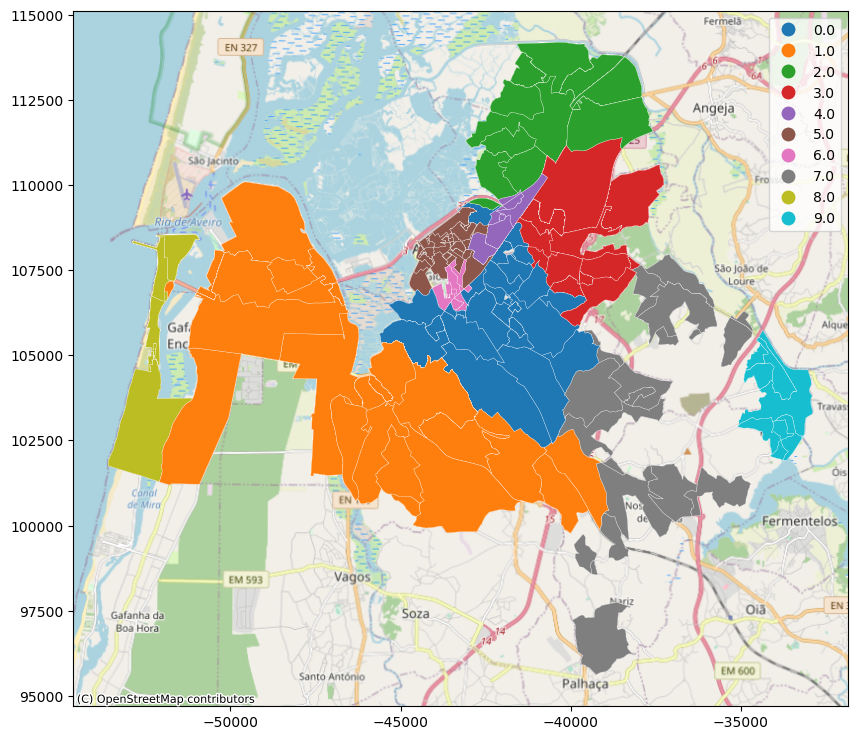

In [164]:
# view Zona_SKATER clusters
ax=plot_spatial_data.plot(figsize=(10, 10), column="Zona_SKATER", categorical=True, edgecolor="w", legend=True, linewidth=0.2,cmap='tab10')
cx.add_basemap(ax,crs=plot_spatial_data.crs,source=cx.providers.OpenStreetMap.Mapnik)


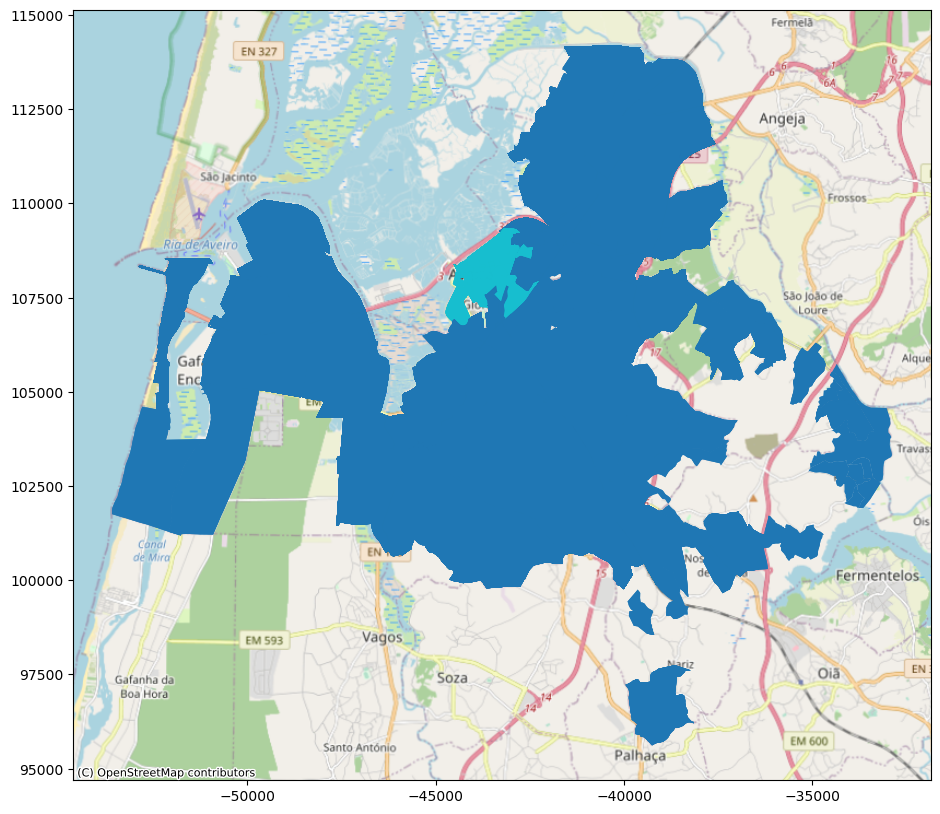

In [165]:
# view cluster of interest - Aveiro vity center
ax=plot_spatial_data.plot(plot_spatial_data['Zona_SKATER']==5.0,figsize=(20,10))
cx.add_basemap(ax,crs=plot_spatial_data.crs,source=cx.providers.OpenStreetMap.Mapnik)

In [166]:
plot_spatial_data.head()

,ID,Nature,Typology,Status,Price,Log_P_A,A,Year,Cluster_new,NrUtentes,AL_pc,T,Log_AL,Log_Typ,geometry,area,Zona_Ward,Zona_Ward_Queen,Zona_Maxp,Zona_SKATER
0,268352,2.0,5.0,1.0,224500.0,6.463698,350.0,2008.0,9.0,0.0,0.0,0.0,0.0,1.609438,"POLYGON ((-38979.844 107301.719, -39032.071 10...",0.127582,4.0,4.0,5.0,3.0
1,295929,1.0,4.0,3.0,137000.0,6.851002,145.0,2008.0,45.0,0.0,0.0,0.0,0.0,1.386294,"POLYGON ((-42807.987 107844.848, -42845.316 10...",0.048703,9.0,2.0,2.0,4.0
2,259211,1.0,3.0,1.0,193000.0,6.966439,182.0,2008.0,19.0,0.0,0.0,0.0,0.0,1.098612,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0
3,259235,2.0,5.0,4.0,374000.0,6.840547,400.0,2008.0,48.0,0.0,0.0,0.0,0.0,1.609438,"POLYGON ((-49390.576 107791.820, -49409.232 10...",2.742660,1.0,1.0,1.0,1.0
4,259228,1.0,2.0,1.0,91500.0,7.080289,77.0,2008.0,19.0,0.0,0.0,0.0,0.0,0.693147,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0


In [167]:
# filter data for Aveiro city center
data_aveiro=spatial_data[spatial_data['Zona_SKATER']==5.0]

In [168]:
# transform data to geodataframe
data_aveiro=GeoDataFrame(data_aveiro, geometry='geometry')

In [169]:
data_aveiro.reset_index(drop=True, inplace=True)

In [170]:
data_aveiro.head()

,ID,Nature,Typology,Status,Price,Log_P_A,A,Year,Cluster_new,NrUtentes,AL_pc,T,Log_AL,Log_Typ,geometry,area,Zona_Ward,Zona_Ward_Queen,Zona_Maxp,Zona_SKATER
0,259211,1.0,3.0,1.0,193000.0,6.966439,182.0,2008.0,19.0,0.0,0.0,0.0,0.0,1.098612,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0
1,259228,1.0,2.0,1.0,91500.0,7.080289,77.0,2008.0,19.0,0.0,0.0,0.0,0.0,0.693147,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0
2,259210,1.0,2.0,1.0,94000.0,7.020233,84.0,2008.0,19.0,0.0,0.0,0.0,0.0,0.693147,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0
3,295932,1.0,4.0,1.0,168100.0,6.957141,160.0,2008.0,19.0,0.0,0.0,0.0,0.0,1.386294,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0
4,259227,1.0,2.0,1.0,100000.0,6.969631,94.0,2008.0,19.0,0.0,0.0,0.0,0.0,0.693147,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0


In [171]:
# check no. of dwellings per cluster in Aveiro Center
pd.pivot_table(data_aveiro, values='Log_P_A', index=['Cluster_new'], aggfunc=lambda x: len(x.unique()))
# não incluir cluster 80, 102 e 106, por escassez de dados

,Log_P_A
Cluster_new,
19.0,414
22.0,5
26.0,60
28.0,4
31.0,207
40.0,63
41.0,95
42.0,44
43.0,29


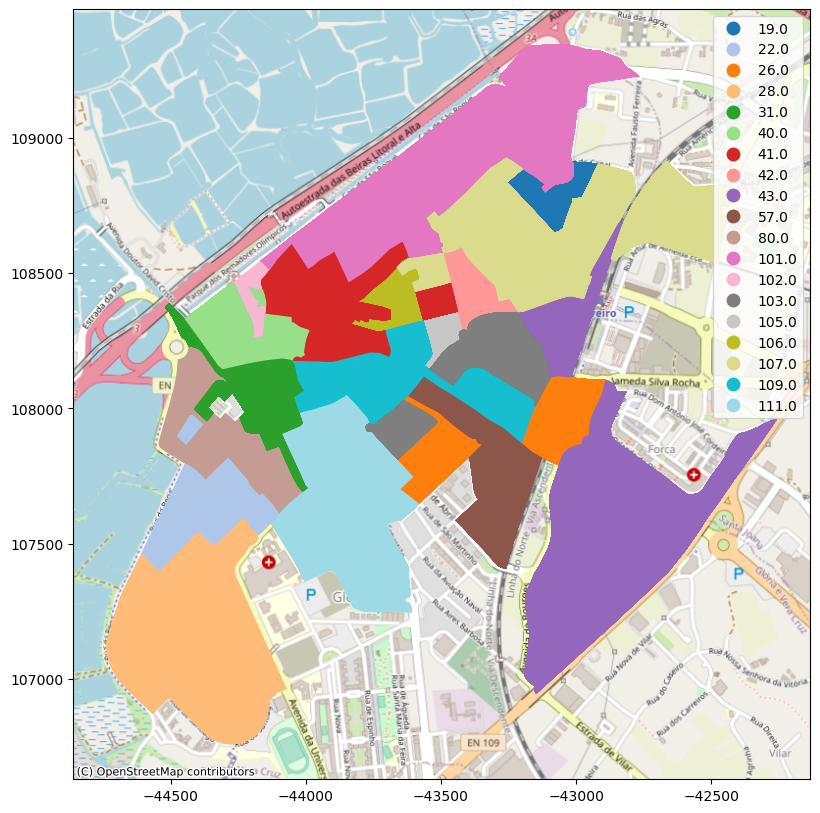

In [172]:
# view clusters in Aveiro city center
ax=data_aveiro.plot(column=data_aveiro['Cluster_new'],categorical=True, legend=True, figsize=(10,10), cmap='tab20')
cx.add_basemap(ax,crs=data_aveiro.crs,source=cx.providers.OpenStreetMap.Mapnik)

In [173]:
# Area de Intervenção, a ser considerada D = 1 (para SKATER)
lista_D1=[19,40,41,42,101,102,103,105,106,107,109]

In [174]:
# apply above list to data
data_aveiro['D']=np.where(data_aveiro['Cluster_new'].isin(lista_D1), 1, 0)

In [175]:
data_aveiro.to_pickle('../Data/data_aveiro_skater.piclo')

In [176]:
data_aveiro['D'].value_counts()

D
1    1304
0     448
Name: count, dtype: int64

In [177]:
sum(data_aveiro['D'].value_counts())

1752

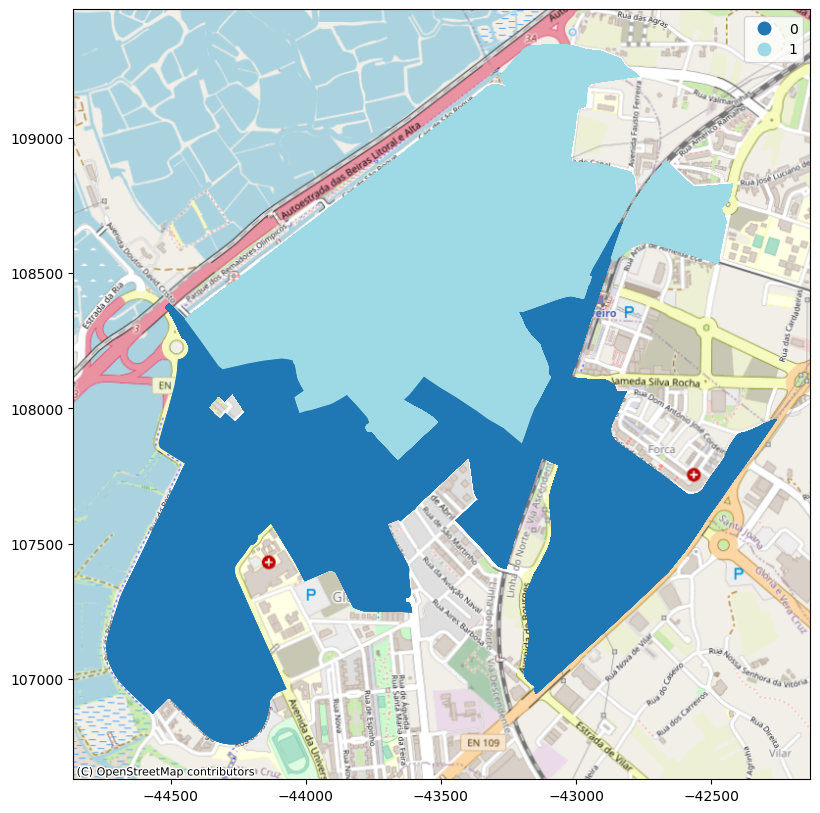

In [178]:
# check areas defined as control and intervention areas (D=0 and D=1)
ax=data_aveiro.plot(column=data_aveiro['D'],categorical=True, legend=True, figsize=(10,10), cmap='tab20')
cx.add_basemap(ax,crs=data_aveiro.crs,source=cx.providers.OpenStreetMap.Mapnik)

In [179]:
# calculate DT (true when both D and T are equal to 1)
data_aveiro['DT']=data_aveiro['D']*data_aveiro['T']

In [180]:
# valores do Indice de Preços da Habitação para Aveiro (valores para 21, 22 e 23 são previsões, com base na tendência dos últimos anos)
IPI2005=116.5
IPI2006=110.9
IPI2007=114.3
IPI2008=109.4
IPI2009=103.1
IPI2010=104.4
IPI2018=100.8
IPI2019=114.2
IPI2020=126.2
IPI2021=131.9
IPI2022=133.3
IPI2023=134.6

In [181]:
# write IPI values to new column
def new_column_value(Year):
    if Year == 2005.0:
        return IPI2005
    elif Year == 2006.0:
        return IPI2006
    elif Year == 2007.0:
        return IPI2007
    elif Year == 2008.0:
        return IPI2008
    elif Year == 2009.0:
        return IPI2009
    elif Year == 2010.0:
        return IPI2010
    elif Year == 2018.0:
        return IPI2018
    elif Year == 2019.0:
        return IPI2019
    elif Year == 2020.0:
        return IPI2020
    elif Year == 2021.0:
        return IPI2021
    elif Year == 2022.0:
        return IPI2022
    elif Year == 2023.0:
        return IPI2023


data_aveiro["IPI"] = data_aveiro["Year"].apply(new_column_value)

In [182]:
# calculate log of IPI
data_aveiro["Log_IPI"]=np.log(data_aveiro['IPI'])

In [183]:
# calculate log of Typology
data_aveiro['Log_Typ']=np.log(data_aveiro['Typology'])

In [184]:
# get dummies
linreg_center = pd.get_dummies(data_aveiro, columns=['Nature','Status','Year','Cluster_new'], drop_first=True, dtype=float)

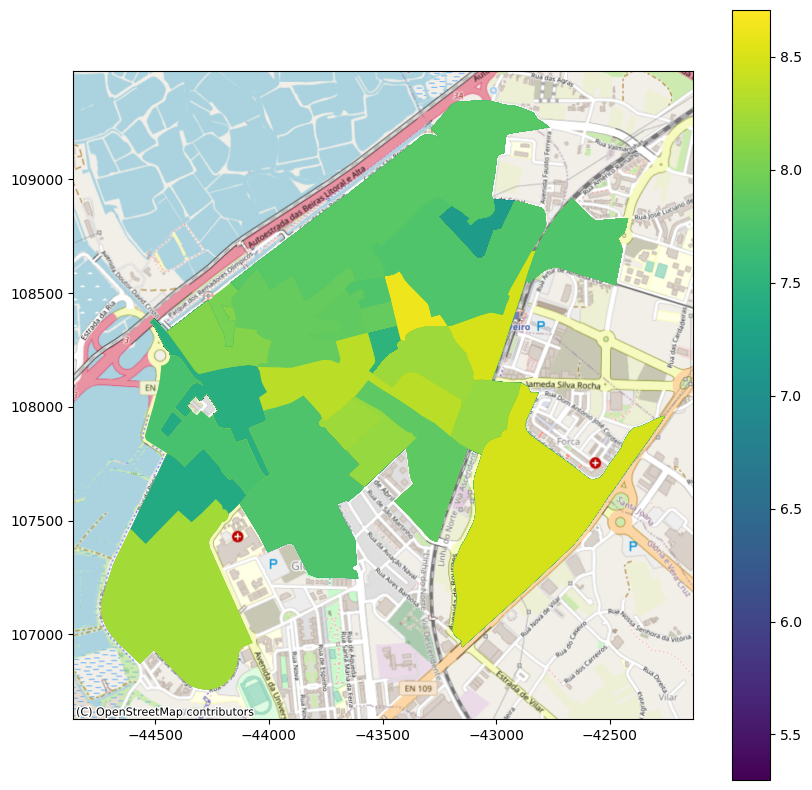

In [185]:
# check log_P_A distribution in the territory
ax=data_aveiro.plot(column=data_aveiro['Log_P_A'], legend=True, figsize=(10,10), cmap='viridis')
cx.add_basemap(ax,crs=data_aveiro.crs,source=cx.providers.OpenStreetMap.Mapnik)

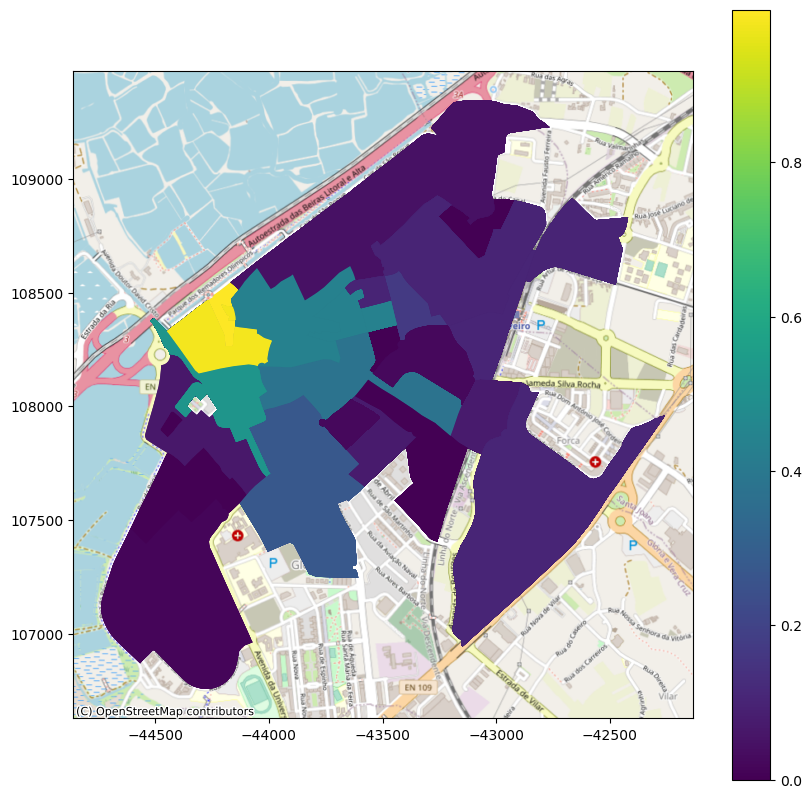

In [186]:
# check log_AL distribution in the territory
ax=data_aveiro.plot(column=data_aveiro['Log_AL'], legend=True, figsize=(10,10), cmap='viridis')
cx.add_basemap(ax,crs=data_aveiro.crs,source=cx.providers.OpenStreetMap.Mapnik)

### 3.2 Linear Regression (focused in Aveiro Center - SKATER Cluster)

In [187]:
linreg_center.columns

Index(['ID', 'Typology', 'Price', 'Log_P_A', 'A', 'NrUtentes', 'AL_pc', 'T',
       'Log_AL', 'Log_Typ', 'geometry', 'area', 'Zona_Ward', 'Zona_Ward_Queen',
       'Zona_Maxp', 'Zona_SKATER', 'D', 'DT', 'IPI', 'Log_IPI', 'Nature_2.0',
       'Status_2.0', 'Status_3.0', 'Status_4.0', 'Status_5.0', 'Year_2006.0',
       'Year_2007.0', 'Year_2008.0', 'Year_2009.0', 'Year_2010.0',
       'Year_2018.0', 'Year_2019.0', 'Year_2020.0', 'Year_2021.0',
       'Year_2022.0', 'Year_2023.0', 'Cluster_new_22.0', 'Cluster_new_26.0',
       'Cluster_new_28.0', 'Cluster_new_31.0', 'Cluster_new_40.0',
       'Cluster_new_41.0', 'Cluster_new_42.0', 'Cluster_new_43.0',
       'Cluster_new_57.0', 'Cluster_new_80.0', 'Cluster_new_101.0',
       'Cluster_new_102.0', 'Cluster_new_103.0', 'Cluster_new_105.0',
       'Cluster_new_106.0', 'Cluster_new_107.0', 'Cluster_new_109.0',
       'Cluster_new_111.0'],
      dtype='object')

In [188]:
# check number of dwellings per cluster
pd.pivot_table(data_aveiro, values='Log_P_A', index=['Cluster_new'], aggfunc=lambda x: len(x.unique()))

,Log_P_A
Cluster_new,
19.0,414
22.0,5
26.0,60
28.0,4
31.0,207
40.0,63
41.0,95
42.0,44
43.0,29


In [189]:
# define X and y
c_y_eur_area  = linreg_center['Log_P_A'].astype(float)

c_X_eur_area = linreg_center[['DT','D','T',
       'Nature_2.0','Log_AL', 'Log_Typ',
       'Status_2.0', 'Status_3.0', 'Status_4.0', 'Status_5.0',
       'Year_2006.0', 'Year_2007.0', 'Year_2008.0', 'Year_2009.0',
       'Year_2010.0','Year_2019.0', 'Year_2020.0',
       'Year_2021.0', 'Year_2022.0', 'Year_2023.0',
       'Cluster_new_26.0','Cluster_new_31.0',
       'Cluster_new_40.0', 'Cluster_new_41.0', 'Cluster_new_42.0',
       'Cluster_new_43.0', 'Cluster_new_57.0',
       'Cluster_new_101.0', 'Cluster_new_103.0',
       'Cluster_new_105.0', 'Cluster_new_107.0',
       'Cluster_new_109.0']].astype(float)


# menos de 10 casos - Clusters: 106.0, 102.0, 80.0, 28.0 e 22.0, 110.0
# removido Log_IPI, Year_2023, Year_2018 VIF muito alto

In [190]:
# check VIF
vif_data = pd.DataFrame()
vif_data["feature"] = c_X_eur_area.columns
  
# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(c_X_eur_area.values, i)
                          for i in range(len(c_X_eur_area.columns))]

print(vif_data)

              feature        VIF
0                  DT   7.622782
1                   D  73.397828
2                   T  32.882562
3          Nature_2.0   1.881086
4              Log_AL  14.818903
5             Log_Typ  12.998387
6          Status_2.0   2.042451
7          Status_3.0   2.292700
8          Status_4.0   1.530970
9          Status_5.0   2.735095
10        Year_2006.0   3.884264
11        Year_2007.0  18.077789
12        Year_2008.0  24.418366
13        Year_2009.0  17.376962
14        Year_2010.0  20.926962
15        Year_2019.0   2.091836
16        Year_2020.0   1.476085
17        Year_2021.0   1.426804
18        Year_2022.0   1.708198
19        Year_2023.0   1.428453
20   Cluster_new_26.0   5.461919
21   Cluster_new_31.0  16.326862
22   Cluster_new_40.0   3.103916
23   Cluster_new_41.0   1.614916
24   Cluster_new_42.0   1.327488
25   Cluster_new_43.0   2.926737
26   Cluster_new_57.0   2.660546
27  Cluster_new_101.0   2.664713
28  Cluster_new_103.0   3.014879
29  Cluste

In [191]:
# linear model for casasapo with log of price per square meter as dependent variable
c_X_eur_area = sm.add_constant(c_X_eur_area)
model_c_eur_area = sm.OLS(c_y_eur_area, c_X_eur_area)
results_c_eur_area = model_c_eur_area.fit()
results_c_eur_area.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                 Results: Ordinary least squares
==================================================================
Model:              OLS              Adj. R-squared:     0.585    
Dependent Variable: Log_P_A          AIC:                -60.2341 
Date:               2023-06-05 15:44 BIC:                120.2268 
No. Observations:   1752             Log-Likelihood:     63.117   
Df Model:           32               F-statistic:        78.26    
Df Residuals:       1719             Prob (F-statistic): 1.10e-307
R-squared:          0.593            Scale:              0.055525 
------------------------------------------------------------------
                    Coef.  Std.Err.    t    P>|t|   [0.025  0.975]
------------------------------------------------------------------
const               7.5570   0.2443 30.9379 0.0000  7.0779  8.0361
DT                  0.4094   0.0442  9.2571 0.0000  0.3226  0.4961
D                  -0.1090   0.0576 -1.8923 0.0586 -0.2219  0.0040
T                   0.2646   0.2410  1.0981 0.2723 -0.2080  0.7373
Nature_2.0         -0.2007   0.0269 -7.4493 0.0000 -0.2535 -0.1479
Log_AL             -0.9560   0.1044 -9.1566 0.0000 -1.1608 -0.7512
Log_Typ            -0.0941   0.0173 -5.4332 0.0000 -0.1281 -0.0601
Status_2.0         -0.0339   0.0191 -1.7720 0.0766 -0.0713  0.0036
Status_3.0         -0.1589   0.0168 -9.4427 0.0000 -0.1920 -0.1259
Status_4.0         -0.2913   0.0297 -9.8231 0.0000 -0.3495 -0.2331
Status_5.0          0.0279   0.0199  1.4028 0.1609 -0.0111  0.0668
Year_2006.0        -0.0780   0.2385 -0.3272 0.7436 -0.5459  0.3898
Year_2007.0        -0.1229   0.2367 -0.5190 0.6038 -0.5872  0.3415
Year_2008.0        -0.1269   0.2364 -0.5367 0.5915 -0.5906  0.3368
Year_2009.0        -0.1215   0.2366 -0.5134 0.6077 -0.5856  0.3426
Year_2010.0        -0.1594   0.2364 -0.6743 0.5002 -0.6231  0.3043
Year_2019.0         0.3350   0.0644  5.2010 0.0000  0.2087  0.4613
Year_2020.0         0.3022   0.0379  7.9693 0.0000  0.2278  0.3766
Year_2021.0         0.3872   0.0411  9.4300 0.0000  0.3066  0.4677
Year_2022.0         0.5979   0.0455 13.1543 0.0000  0.5087  0.6870
Year_2023.0         0.7609   0.0996  7.6408 0.0000  0.5656  0.9562
Cluster_new_26.0   -0.0405   0.0612 -0.6611 0.5086 -0.1605  0.0796
Cluster_new_31.0   -0.0129   0.0596 -0.2174 0.8279 -0.1298  0.1039
Cluster_new_40.0    0.4898   0.0416 11.7845 0.0000  0.4083  0.5713
Cluster_new_41.0    0.1827   0.0279  6.5424 0.0000  0.1279  0.2375
Cluster_new_42.0   -0.0236   0.0388 -0.6091 0.5426 -0.0997  0.0525
Cluster_new_43.0   -0.0675   0.0658 -1.0265 0.3048 -0.1966  0.0615
Cluster_new_57.0   -0.0492   0.0678 -0.7261 0.4679 -0.1823  0.0838
Cluster_new_101.0  -0.4114   0.0609 -6.7582 0.0000 -0.5308 -0.2920
Cluster_new_103.0  -0.3987   0.0664 -6.0024 0.0000 -0.5290 -0.2684
Cluster_new_105.0   0.1528   0.0310  4.9345 0.0000  0.0920  0.2135
Cluster_new_107.0  -0.4458   0.0527 -8.4554 0.0000 -0.5492 -0.3424
Cluster_new_109.0  -0.0223   0.0654 -0.3406 0.7335 -0.1505  0.1060
------------------------------------------------------------------
Omnibus:              239.612      Durbin-Watson:         1.723   
Prob(Omnibus):        0.000        Jarque-Bera (JB):      2491.073
Skew:                 -0.234       Prob(JB):              0.000   
Kurtosis:             8.823        Condition No.:         202     
==================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the
errors is correctly specified.
"""

#### 3.1.a - Diagnostic plots
https://www.statsmodels.org/dev/examples/notebooks/generated/linear_regression_diagnostics_plots.html

In [192]:
# base code for diagnostic plots

style_talk = 'seaborn-talk'    #refer to plt.style.available

class Linear_Reg_Diagnostic():
    """
    Diagnostic plots to identify potential problems in a linear regression fit.
    Mainly,
        a. non-linearity of data
        b. Correlation of error terms
        c. non-constant variance
        d. outliers
        e. high-leverage points
        f. collinearity

    Author:
        Prajwal Kafle (p33ajkafle@gmail.com, where 3 = r)
        Does not come with any sort of warranty.
        Please test the code one your end before using.
    """

    def __init__(self,
                 results: Type[statsmodels.regression.linear_model.RegressionResultsWrapper]) -> None:
        """
        For a linear regression model, generates following diagnostic plots:

        a. residual
        b. qq
        c. scale location and
        d. leverage

        and a table

        e. vif

        Args:
            results (Type[statsmodels.regression.linear_model.RegressionResultsWrapper]):
                must be instance of statsmodels.regression.linear_model object

        Raises:
            TypeError: if instance does not belong to above object

        Example:
        >>> import numpy as np
        >>> import pandas as pd
        >>> import statsmodels.formula.api as smf
        >>> x = np.linspace(-np.pi, np.pi, 100)
        >>> y = 3*x + 8 + np.random.normal(0,1, 100)
        >>> df = pd.DataFrame({'x':x, 'y':y})
        >>> res = smf.ols(formula= "y ~ x", data=df).fit()
        >>> cls = Linear_Reg_Diagnostic(res)
        >>> cls(plot_context="seaborn-paper")

        In case you do not need all plots you can also independently make an individual plot/table
        in following ways

        >>> cls = Linear_Reg_Diagnostic(res)
        >>> cls.residual_plot()
        >>> cls.qq_plot()
        >>> cls.scale_location_plot()
        >>> cls.leverage_plot()
        >>> cls.vif_table()
        """

        if isinstance(results, statsmodels.regression.linear_model.RegressionResultsWrapper) is False:
            raise TypeError("result must be instance of statsmodels.regression.linear_model.RegressionResultsWrapper object")

        self.results = maybe_unwrap_results(results)

        self.y_true = self.results.model.endog
        self.y_predict = self.results.fittedvalues
        self.xvar = self.results.model.exog
        self.xvar_names = self.results.model.exog_names

        self.residual = np.array(self.results.resid)
        influence = self.results.get_influence()
        self.residual_norm = influence.resid_studentized_internal
        self.leverage = influence.hat_matrix_diag
        self.cooks_distance = influence.cooks_distance[0]
        self.nparams = len(self.results.params)

    def __call__(self, plot_context='seaborn-paper'):
        # print(plt.style.available)
        with plt.style.context(plot_context):
            fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10,10))
            self.residual_plot(ax=ax[0,0])
            self.qq_plot(ax=ax[0,1])
            self.scale_location_plot(ax=ax[1,0])
            self.leverage_plot(ax=ax[1,1])
            plt.show()

        self.vif_table()
        return fig, ax


    def residual_plot(self, ax=None):
        """
        Residual vs Fitted Plot

        Graphical tool to identify non-linearity.
        (Roughly) Horizontal red line is an indicator that the residual has a linear pattern
        """
        if ax is None:
            fig, ax = plt.subplots()

        sns.residplot(
            x=self.y_predict,
            y=self.residual,
            lowess=True,
            scatter_kws={'alpha': 0.5},
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        residual_abs = np.abs(self.residual)
        abs_resid = np.flip(np.sort(residual_abs))
        abs_resid_top_3 = abs_resid[:3]
        for i, _ in enumerate(abs_resid_top_3):
            ax.annotate(
                i,
                xy=(self.y_predict[i], self.residual[i]),
                color='C3')

        ax.set_title('Residuals vs Fitted', fontweight="bold")
        ax.set_xlabel('Fitted values')
        ax.set_ylabel('Residuals')
        return ax

    def qq_plot(self, ax=None):
        """
        Standarized Residual vs Theoretical Quantile plot

        Used to visually check if residuals are normally distributed.
        Points spread along the diagonal line will suggest so.
        """
        if ax is None:
            fig, ax = plt.subplots()

        QQ = ProbPlot(self.residual_norm)
        QQ.qqplot(line='45', alpha=0.5, lw=1, ax=ax)

        # annotations
        abs_norm_resid = np.flip(np.argsort(np.abs(self.residual_norm)), 0)
        abs_norm_resid_top_3 = abs_norm_resid[:3]
        for r, i in enumerate(abs_norm_resid_top_3):
            ax.annotate(
                i,
                xy=(np.flip(QQ.theoretical_quantiles, 0)[r], self.residual_norm[i]),
                ha='right', color='C3')

        ax.set_title('Normal Q-Q', fontweight="bold")
        ax.set_xlabel('Theoretical Quantiles')
        ax.set_ylabel('Standardized Residuals')
        return ax

    def scale_location_plot(self, ax=None):
        """
        Sqrt(Standarized Residual) vs Fitted values plot

        Used to check homoscedasticity of the residuals.
        Horizontal line will suggest so.
        """
        if ax is None:
            fig, ax = plt.subplots()

        residual_norm_abs_sqrt = np.sqrt(np.abs(self.residual_norm))

        ax.scatter(self.y_predict, residual_norm_abs_sqrt, alpha=0.5);
        sns.regplot(
            x=self.y_predict,
            y=residual_norm_abs_sqrt,
            scatter=False, ci=False,
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        abs_sq_norm_resid = np.flip(np.argsort(residual_norm_abs_sqrt), 0)
        abs_sq_norm_resid_top_3 = abs_sq_norm_resid[:3]
        for i in abs_sq_norm_resid_top_3:
            ax.annotate(
                i,
                xy=(self.y_predict[i], residual_norm_abs_sqrt[i]),
                color='C3')
        ax.set_title('Scale-Location', fontweight="bold")
        ax.set_xlabel('Fitted values')
        ax.set_ylabel(r'$\sqrt{|\mathrm{Standardized\ Residuals}|}$');
        return ax

    def leverage_plot(self, ax=None):
        """
        Residual vs Leverage plot

        Points falling outside Cook's distance curves are considered observation that can sway the fit
        aka are influential.
        Good to have none outside the curves.
        """
        if ax is None:
            fig, ax = plt.subplots()

        ax.scatter(
            self.leverage,
            self.residual_norm,
            alpha=0.5);

        sns.regplot(
            x=self.leverage,
            y=self.residual_norm,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        leverage_top_3 = np.flip(np.argsort(self.cooks_distance), 0)[:3]
        for i in leverage_top_3:
            ax.annotate(
                i,
                xy=(self.leverage[i], self.residual_norm[i]),
                color = 'C3')

        xtemp, ytemp = self.__cooks_dist_line(0.5) # 0.5 line
        ax.plot(xtemp, ytemp, label="Cook's distance", lw=1, ls='--', color='red')
        xtemp, ytemp = self.__cooks_dist_line(1) # 1 line
        ax.plot(xtemp, ytemp, lw=1, ls='--', color='red')

        ax.set_xlim(0, max(self.leverage)+0.01)
        ax.set_title('Residuals vs Leverage', fontweight="bold")
        ax.set_xlabel('Leverage')
        ax.set_ylabel('Standardized Residuals')
        ax.legend(loc='upper right')
        return ax

    def vif_table(self):
        """
        VIF table

        VIF, the variance inflation factor, is a measure of multicollinearity.
        VIF > 5 for a variable indicates that it is highly collinear with the
        other input variables.
        """
        vif_df = pd.DataFrame()
        vif_df["Features"] = self.xvar_names
        vif_df["VIF Factor"] = [variance_inflation_factor(self.xvar, i) for i in range(self.xvar.shape[1])]

        print(vif_df
                .sort_values("VIF Factor")
                .round(2))


    def __cooks_dist_line(self, factor):
        """
        Helper function for plotting Cook's distance curves
        """
        p = self.nparams
        formula = lambda x: np.sqrt((factor * p * (1 - x)) / x)
        x = np.linspace(0.001, max(self.leverage), 50)
        y = formula(x)
        return x, y

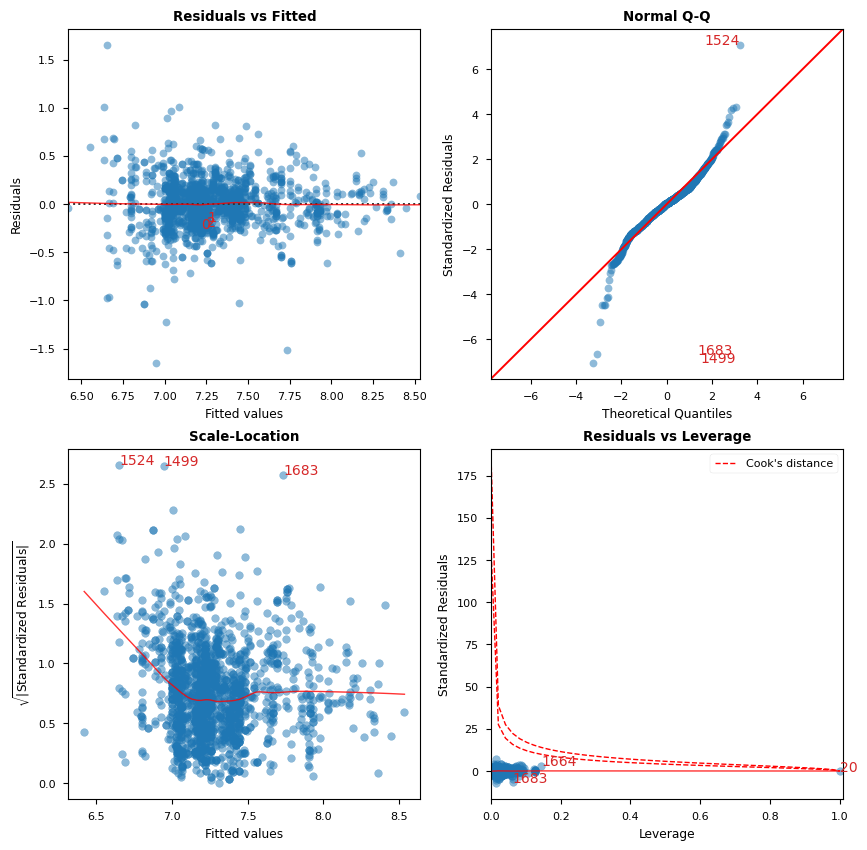

             Features  VIF Factor
25   Cluster_new_42.0        1.29
18        Year_2021.0        1.39
20        Year_2023.0        1.42
17        Year_2020.0        1.43
9          Status_4.0        1.45
6             Log_Typ        1.46
24   Cluster_new_41.0        1.51
30  Cluster_new_105.0        1.66
19        Year_2022.0        1.67
7          Status_2.0        1.69
8          Status_3.0        1.71
4          Nature_2.0        1.73
16        Year_2019.0        2.06
10         Status_5.0        2.14
32  Cluster_new_109.0        2.49
28  Cluster_new_101.0        2.61
31  Cluster_new_107.0        2.67
27   Cluster_new_57.0        2.68
23   Cluster_new_40.0        2.93
29  Cluster_new_103.0        2.95
26   Cluster_new_43.0        2.97
21   Cluster_new_26.0        5.45
1                  DT        6.70
5              Log_AL       11.42
22   Cluster_new_31.0       14.55
2                   D       19.91
11        Year_2006.0       46.87
12        Year_2007.0      224.20
14        Year

In [193]:
# plot diagnostics for the model
cls = Linear_Reg_Diagnostic(results_c_eur_area)
fig, ax = cls()

#### 3.1.c - Difference in Difference validation

In [194]:
data_aveiro.columns

Index(['ID', 'Nature', 'Typology', 'Status', 'Price', 'Log_P_A', 'A', 'Year',
       'Cluster_new', 'NrUtentes', 'AL_pc', 'T', 'Log_AL', 'Log_Typ',
       'geometry', 'area', 'Zona_Ward', 'Zona_Ward_Queen', 'Zona_Maxp',
       'Zona_SKATER', 'D', 'DT', 'IPI', 'Log_IPI'],
      dtype='object')

In [195]:
# copy data for the model (DID validation)
data_aveiro_DID=data_aveiro.copy()

In [196]:
data_aveiro_DID['Year'].unique()

array([2008., 2005., 2006., 2007., 2009., 2010., 2018., 2019., 2020.,
       2021., 2022., 2023.])

In [197]:
# define D=1 and D=0
for i in data_aveiro_DID['Year'].unique():
    data_aveiro_DID['Year'+str(i)]=np.where(data_aveiro_DID['Year']==i, data_aveiro_DID['D'],0)

In [198]:
data_aveiro_DID

,ID,Nature,Typology,Status,Price,Log_P_A,A,Year,Cluster_new,NrUtentes,...,Year2006.0,Year2007.0,Year2009.0,Year2010.0,Year2018.0,Year2019.0,Year2020.0,Year2021.0,Year2022.0,Year2023.0
0,259211,1.0,3.0,1.0,193000.0,6.966439,182.0,2008.0,19.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,259228,1.0,2.0,1.0,91500.0,7.080289,77.0,2008.0,19.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,259210,1.0,2.0,1.0,94000.0,7.020233,84.0,2008.0,19.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,295932,1.0,4.0,1.0,168100.0,6.957141,160.0,2008.0,19.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,259227,1.0,2.0,1.0,100000.0,6.969631,94.0,2008.0,19.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1747,1998153,1.0,4.0,1.0,530435.0,8.291104,133.0,2023.0,103.0,25.0,...,0,0,0,0,0,0,0,0,0,1
1748,1998154,1.0,3.0,1.0,375000.0,8.357344,88.0,2023.0,103.0,25.0,...,0,0,0,0,0,0,0,0,0,1
1749,1998155,1.0,4.0,1.0,520435.0,8.272071,133.0,2023.0,103.0,25.0,...,0,0,0,0,0,0,0,0,0,1
1750,1998156,1.0,4.0,1.0,517935.0,8.267256,133.0,2023.0,103.0,25.0,...,0,0,0,0,0,0,0,0,0,1


In [199]:
# number of dwellings per cluster
pd.pivot_table(data_aveiro_DID, values='Log_P_A', index=['Cluster_new'], aggfunc=lambda x: len(x.unique()))
# não incluir cluster 102 e 106, por escassez de dados

,Log_P_A
Cluster_new,
19.0,414
22.0,5
26.0,60
28.0,4
31.0,207
40.0,63
41.0,95
42.0,44
43.0,29


In [200]:
# get dummies for the DID regression
data_aveiro_DID = pd.get_dummies(data_aveiro_DID, columns=['Nature','Status','Year','Cluster_new'], drop_first=True, dtype=float)


In [201]:
data_aveiro_DID.reset_index(drop=True, inplace=True)

In [202]:
data_aveiro_DID.columns

Index(['ID', 'Typology', 'Price', 'Log_P_A', 'A', 'NrUtentes', 'AL_pc', 'T',
       'Log_AL', 'Log_Typ', 'geometry', 'area', 'Zona_Ward', 'Zona_Ward_Queen',
       'Zona_Maxp', 'Zona_SKATER', 'D', 'DT', 'IPI', 'Log_IPI', 'Year2008.0',
       'Year2005.0', 'Year2006.0', 'Year2007.0', 'Year2009.0', 'Year2010.0',
       'Year2018.0', 'Year2019.0', 'Year2020.0', 'Year2021.0', 'Year2022.0',
       'Year2023.0', 'Nature_2.0', 'Status_2.0', 'Status_3.0', 'Status_4.0',
       'Status_5.0', 'Year_2006.0', 'Year_2007.0', 'Year_2008.0',
       'Year_2009.0', 'Year_2010.0', 'Year_2018.0', 'Year_2019.0',
       'Year_2020.0', 'Year_2021.0', 'Year_2022.0', 'Year_2023.0',
       'Cluster_new_22.0', 'Cluster_new_26.0', 'Cluster_new_28.0',
       'Cluster_new_31.0', 'Cluster_new_40.0', 'Cluster_new_41.0',
       'Cluster_new_42.0', 'Cluster_new_43.0', 'Cluster_new_57.0',
       'Cluster_new_80.0', 'Cluster_new_101.0', 'Cluster_new_102.0',
       'Cluster_new_103.0', 'Cluster_new_105.0', 'Cluster_new_10

In [203]:
# define dependent variable and independent variables
DID_y_eur_area  = data_aveiro_DID['Log_P_A'].astype(float)

DID_X_eur_area = data_aveiro_DID[['Year2006.0', 'Year2007.0','Year2008.0',
       'Year2009.0', 'Year2010.0','Year2018.0', 'Year2019.0', 'Year2020.0', 'Year2021.0', 
       'Year2022.0','T','D', 'DT','Log_AL', 'Log_Typ',  
       'Nature_2.0', 'Status_2.0', 'Status_3.0', 'Status_4.0',
       'Status_5.0',
       'Cluster_new_26.0', 'Cluster_new_40.0', 'Cluster_new_41.0',
       'Cluster_new_42.0', 'Cluster_new_43.0', 'Cluster_new_57.0','Cluster_new_101.0',
       'Cluster_new_103.0', 'Cluster_new_105.0','Cluster_new_107.0', 'Cluster_new_109.0']].astype(float)


# menos de 10 casos - Clusters: 106.0, 102.0, 80.0, 28.0 e 22.0.
# removido Log_IPI, Year2005, Year2023,  VIF muito alto

In [204]:
# run the model
DID_X_eur_area = sm.add_constant(DID_X_eur_area.astype(float))
model_DID_eur_area = sm.OLS(DID_y_eur_area, DID_X_eur_area)
results_DID_eur_area = model_DID_eur_area.fit()
results_DID_eur_area.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                 Results: Ordinary least squares
==================================================================
Model:              OLS              Adj. R-squared:     0.552    
Dependent Variable: Log_P_A          AIC:                76.3510  
Date:               2023-06-05 15:44 BIC:                251.3435 
No. Observations:   1752             Log-Likelihood:     -6.1755  
Df Model:           31               F-statistic:        70.46    
Df Residuals:       1720             Prob (F-statistic): 1.83e-279
R-squared:          0.559            Scale:              0.060061 
------------------------------------------------------------------
                   Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
------------------------------------------------------------------
const              7.4155   0.0295 251.5540 0.0000  7.3577  7.4734
Year2006.0        -0.0894   0.2489  -0.3592 0.7195 -0.5775  0.3987
Year2007.0        -0.1048   0.2463  -0.4256 0.6704 -0.5880  0.3783
Year2008.0        -0.1272   0.2459  -0.5170 0.6052 -0.6095  0.3552
Year2009.0        -0.1369   0.2462  -0.5560 0.5783 -0.6198  0.3460
Year2010.0        -0.1630   0.2459  -0.6627 0.5076 -0.6453  0.3194
Year2018.0        -0.6014   0.1076  -5.5891 0.0000 -0.8125 -0.3904
Year2019.0        -0.3872   0.1252  -3.0920 0.0020 -0.6328 -0.1416
Year2020.0        -0.5407   0.1045  -5.1725 0.0000 -0.7457 -0.3357
Year2021.0        -0.3175   0.1102  -2.8808 0.0040 -0.5337 -0.1013
Year2022.0        -0.1243   0.1023  -1.2148 0.2246 -0.3249  0.0764
T                  0.6704   0.0447  15.0115 0.0000  0.5828  0.7580
D                  0.0314   0.2468   0.1271 0.8989 -0.4528  0.5155
DT                 0.8009   0.2702   2.9637 0.0031  0.2709  1.3310
Log_AL            -1.3921   0.0962 -14.4688 0.0000 -1.5809 -1.2034
Log_Typ           -0.0893   0.0179  -4.9985 0.0000 -0.1243 -0.0543
Nature_2.0        -0.2184   0.0281  -7.7773 0.0000 -0.2735 -0.1633
Status_2.0        -0.0380   0.0198  -1.9160 0.0555 -0.0769  0.0009
Status_3.0        -0.1597   0.0175  -9.1478 0.0000 -0.1939 -0.1254
Status_4.0        -0.2765   0.0307  -9.0180 0.0000 -0.3367 -0.2164
Status_5.0         0.0171   0.0207   0.8276 0.4080 -0.0235  0.0578
Cluster_new_26.0  -0.0286   0.0361  -0.7944 0.4271 -0.0994  0.0421
Cluster_new_40.0   0.6263   0.0400  15.6396 0.0000  0.5477  0.7048
Cluster_new_41.0   0.2233   0.0287   7.7680 0.0000  0.1669  0.2797
Cluster_new_42.0  -0.0693   0.0403  -1.7189 0.0858 -0.1483  0.0098
Cluster_new_43.0  -0.0170   0.0468  -0.3635 0.7163 -0.1087  0.0747
Cluster_new_57.0  -0.1161   0.0545  -2.1309 0.0332 -0.2230 -0.0092
Cluster_new_101.0 -0.4621   0.0646  -7.1518 0.0000 -0.5888 -0.3354
Cluster_new_103.0 -0.4307   0.0722  -5.9622 0.0000 -0.5724 -0.2890
Cluster_new_105.0  0.1424   0.0327   4.3506 0.0000  0.0782  0.2067
Cluster_new_107.0 -0.5053   0.0545  -9.2690 0.0000 -0.6123 -0.3984
Cluster_new_109.0  0.0300   0.0699   0.4290 0.6680 -0.1071  0.1671
------------------------------------------------------------------
Omnibus:              219.399      Durbin-Watson:         1.705   
Prob(Omnibus):        0.000        Jarque-Bera (JB):      2331.029
Skew:                 0.037        Prob(JB):              0.000   
Kurtosis:             8.650        Condition No.:         201     
==================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the
errors is correctly specified.
"""

### 3.2 Spatial Linear Regression (focused in Aveiro Center - SKATER Cluster)

In [205]:
#Geração da matriz W, a partir do subset, usando a de matriz de contiguidade Queen
w_Queen = weights.contiguity.Queen.from_dataframe(data_aveiro)
# Standardização das linhas
w_Queen.transform = 'R'

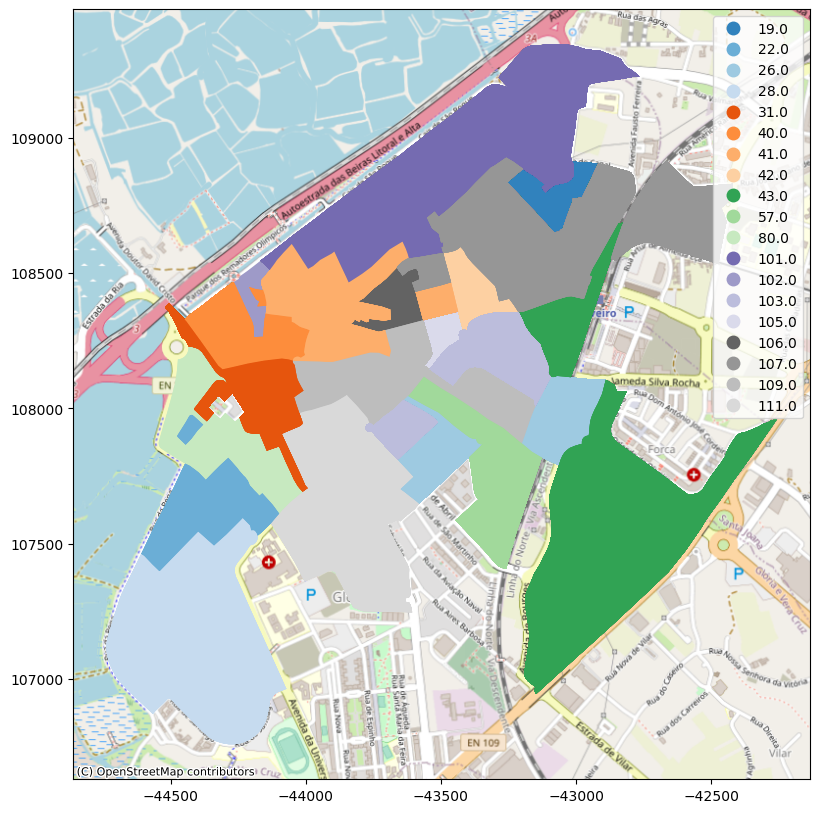

In [206]:
ax=data_aveiro.plot(column='Cluster_new',categorical=True, legend=True, figsize=(10,10), cmap='tab20c')
cx.add_basemap(ax,crs=data_aveiro.crs,source=cx.providers.OpenStreetMap.Mapnik)

In [207]:
# copy data for the model (spatial reg)
spatial_reg=data_aveiro.copy()

In [208]:
spatial_reg.columns

Index(['ID', 'Nature', 'Typology', 'Status', 'Price', 'Log_P_A', 'A', 'Year',
       'Cluster_new', 'NrUtentes', 'AL_pc', 'T', 'Log_AL', 'Log_Typ',
       'geometry', 'area', 'Zona_Ward', 'Zona_Ward_Queen', 'Zona_Maxp',
       'Zona_SKATER', 'D', 'DT', 'IPI', 'Log_IPI'],
      dtype='object')

In [209]:
# get dummies for the spatial regression
spatial_reg = pd.get_dummies(spatial_reg, columns=['Nature','Status','Year','Cluster_new'], drop_first=True, dtype=float)

In [210]:
spatial_reg.columns

Index(['ID', 'Typology', 'Price', 'Log_P_A', 'A', 'NrUtentes', 'AL_pc', 'T',
       'Log_AL', 'Log_Typ', 'geometry', 'area', 'Zona_Ward', 'Zona_Ward_Queen',
       'Zona_Maxp', 'Zona_SKATER', 'D', 'DT', 'IPI', 'Log_IPI', 'Nature_2.0',
       'Status_2.0', 'Status_3.0', 'Status_4.0', 'Status_5.0', 'Year_2006.0',
       'Year_2007.0', 'Year_2008.0', 'Year_2009.0', 'Year_2010.0',
       'Year_2018.0', 'Year_2019.0', 'Year_2020.0', 'Year_2021.0',
       'Year_2022.0', 'Year_2023.0', 'Cluster_new_22.0', 'Cluster_new_26.0',
       'Cluster_new_28.0', 'Cluster_new_31.0', 'Cluster_new_40.0',
       'Cluster_new_41.0', 'Cluster_new_42.0', 'Cluster_new_43.0',
       'Cluster_new_57.0', 'Cluster_new_80.0', 'Cluster_new_101.0',
       'Cluster_new_102.0', 'Cluster_new_103.0', 'Cluster_new_105.0',
       'Cluster_new_106.0', 'Cluster_new_107.0', 'Cluster_new_109.0',
       'Cluster_new_111.0'],
      dtype='object')

In [211]:
# Criação de dataframe com variável dependente, para uso nos modelos (NORTE)
Dep_Var = spatial_reg['Log_P_A'].astype(float)

# Criação de dataframe com variáveis independente, para uso nos modelos (NORTE)
Ind_Var = spatial_reg[['DT','D','T',
       'Nature_2.0','Log_AL', 'Log_Typ',
       'Status_2.0', 'Status_3.0', 'Status_4.0', 'Status_5.0',
       'Year_2006.0', 'Year_2007.0', 'Year_2008.0', 'Year_2009.0',
       'Year_2010.0','Year_2019.0', 'Year_2020.0',
       'Year_2021.0', 'Year_2022.0', 'Year_2023.0',
       'Cluster_new_26.0','Cluster_new_31.0',
       'Cluster_new_40.0', 'Cluster_new_41.0', 'Cluster_new_42.0',
       'Cluster_new_43.0', 'Cluster_new_57.0',
       'Cluster_new_101.0', 'Cluster_new_103.0',
       'Cluster_new_105.0', 'Cluster_new_107.0',
       'Cluster_new_109.0']].astype(float)
# apenas 1 caso - 'Cluster_new_106.0','Cluster_new_102.0'
# removido Cluster_new_31.0, VIF muito alto

In [212]:
# calculate VIF
vif_data = pd.DataFrame()
vif_data["feature"] = Ind_Var.columns
  
# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(Ind_Var.values, i)
                          for i in range(len(Ind_Var.columns))]

print(vif_data)

              feature        VIF
0                  DT   7.622782
1                   D  73.397828
2                   T  32.882562
3          Nature_2.0   1.881086
4              Log_AL  14.818903
5             Log_Typ  12.998387
6          Status_2.0   2.042451
7          Status_3.0   2.292700
8          Status_4.0   1.530970
9          Status_5.0   2.735095
10        Year_2006.0   3.884264
11        Year_2007.0  18.077789
12        Year_2008.0  24.418366
13        Year_2009.0  17.376962
14        Year_2010.0  20.926962
15        Year_2019.0   2.091836
16        Year_2020.0   1.476085
17        Year_2021.0   1.426804
18        Year_2022.0   1.708198
19        Year_2023.0   1.428453
20   Cluster_new_26.0   5.461919
21   Cluster_new_31.0  16.326862
22   Cluster_new_40.0   3.103916
23   Cluster_new_41.0   1.614916
24   Cluster_new_42.0   1.327488
25   Cluster_new_43.0   2.926737
26   Cluster_new_57.0   2.660546
27  Cluster_new_101.0   2.664713
28  Cluster_new_103.0   3.014879
29  Cluste

In [213]:
# Non-spatial Model (multiple regression)
M_OLS = spreg.OLS(
    Dep_Var.to_numpy(), # Dependent variable
    Ind_Var.to_numpy(), # Independent variable
    name_y = 'Log_P_A', # Dependent variable name
    name_x = list(Ind_Var.columns), #Independent variable name
    w = w_Queen,
    spat_diag=True,
    moran=True,
    name_ds='spatial_reg',
    name_w='w_Queen'
    )

print(M_OLS.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            : spatial_reg
Weights matrix      :     w_Queen
Dependent Variable  :     Log_P_A                Number of Observations:        1752
Mean dependent var  :      7.2782                Number of Variables   :          33
S.D. dependent var  :      0.3660                Degrees of Freedom    :        1719
R-squared           :      0.5930
Adjusted R-squared  :      0.5854
Sum squared residual:      95.448                F-statistic           :     78.2555
Sigma-square        :       0.056                Prob(F-statistic)     :  1.099e-307
S.E. of regression  :       0.236                Log likelihood        :      63.117
Sigma-square ML     :       0.054                Akaike info criterion :     -60.234
S.E of regression ML:      0.2334                Schwarz criterion     :     120.227

-----------------------------------------------------------------------------

LM error and LM Lag are non significant (0.61 and 0.17), hence we keep OLS as per Elhorst (2010).

## 4. (NOK) Linear Regressions (Ílhavo)

### 4.1 **(NOK)** Linear Regression (focused in Ílhavo Center - SKATER Cluster)

Poucos dados nesta região!!!

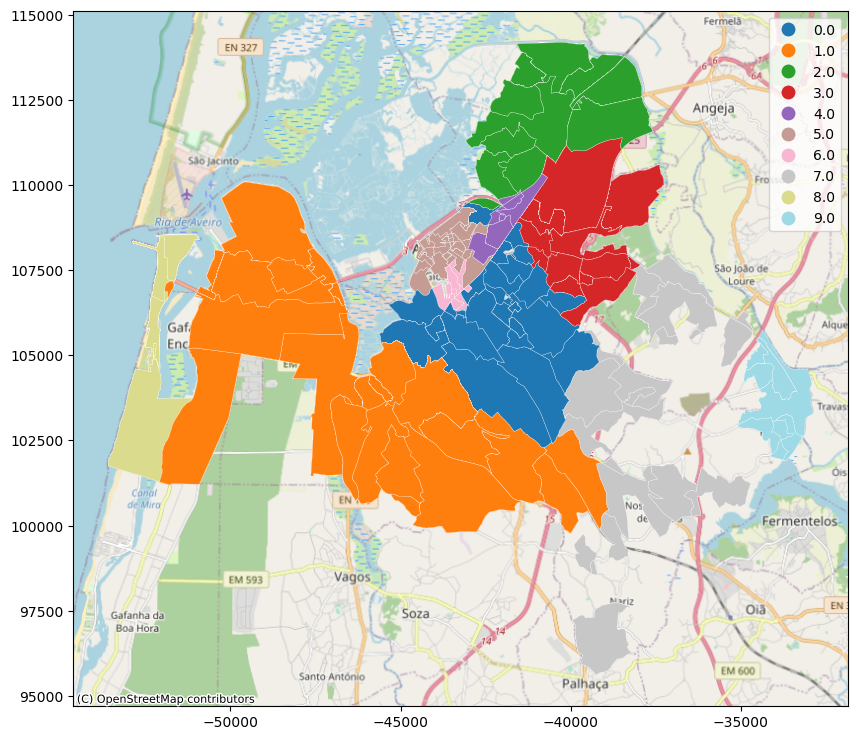

In [214]:
# check SKATER results
ax=plot_spatial_data.plot(figsize=(10, 10), column=plot_spatial_data["Zona_SKATER"], categorical=True, edgecolor="w", legend=True, linewidth=0.2,cmap='tab20')
cx.add_basemap(ax,crs=clusters.crs,source=cx.providers.OpenStreetMap.Mapnik)

In [215]:
# define skater cluster for Ilhavo
data_ilhavo=spatial_data[spatial_data['Zona_SKATER']==1.0]

In [216]:
# transform to geodataframe
data_ilhavo=GeoDataFrame(data_ilhavo, geometry='geometry')

In [217]:
data_ilhavo.reset_index(drop=True, inplace=True)

In [218]:
data_ilhavo.head()

,ID,Nature,Typology,Status,Price,Log_P_A,A,Year,Cluster_new,NrUtentes,AL_pc,T,Log_AL,Log_Typ,geometry,area,Zona_Ward,Zona_Ward_Queen,Zona_Maxp,Zona_SKATER
0,259235,2.0,5.0,4.0,374000.00,6.840547,400.0,2008.0,48.0,0.0,0.0,0.0,0.0,1.609438,"POLYGON ((-49390.576 107791.820, -49409.232 10...",2.742660,1.0,1.0,1.0,1.0
1,328406,1.0,3.0,1.0,167000.00,7.708261,75.0,2008.0,48.0,0.0,0.0,0.0,0.0,1.098612,"POLYGON ((-49390.576 107791.820, -49409.232 10...",2.742660,1.0,1.0,1.0,1.0
2,259225,2.0,5.0,4.0,174500.00,6.548219,250.0,2008.0,2.0,0.0,0.0,0.0,0.0,1.609438,"POLYGON ((-41894.818 101023.152, -41985.704 10...",0.023841,4.0,2.0,7.0,1.0
3,563295,1.0,3.0,3.0,107241.54,6.977669,100.0,2008.0,54.0,0.0,0.0,0.0,0.0,1.098612,"POLYGON ((-45337.609 103661.755, -45353.774 10...",0.013032,1.0,1.0,1.0,1.0
4,563447,2.0,5.0,2.0,225000.00,6.843217,240.0,2008.0,35.0,0.0,0.0,0.0,0.0,1.609438,"POLYGON ((-40120.243 101443.753, -40179.897 10...",0.126959,3.0,2.0,7.0,1.0


In [219]:
# no. of dwellings per cluster
pd.pivot_table(data_ilhavo, values='Log_P_A', index=['Cluster_new'], aggfunc=lambda x: len(x.unique()))

,Log_P_A
Cluster_new,
2.0,73
33.0,41
35.0,60
48.0,123
50.0,107
51.0,164
52.0,44
53.0,92
54.0,213


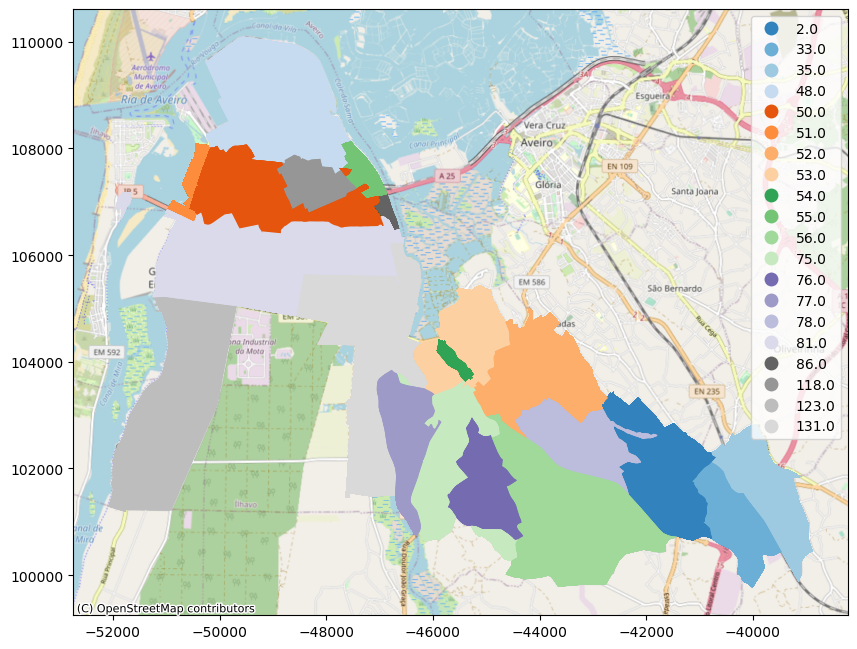

In [220]:
# check filter results
ax=data_ilhavo.plot(column=data_ilhavo['Cluster_new'],categorical=True, legend=True, figsize=(10,10), cmap='tab20c')
cx.add_basemap(ax,crs=data_ilhavo.crs,source=cx.providers.OpenStreetMap.Mapnik)

In [221]:
# list of zones to be excluded from the analysis
lista_ilhavo_exclusao=[35,48,50,51,86,118,123,55,81]

In [222]:
# Area de Intervenção, a ser considerada D = 1
lista_ilhavo_D1=[75,77]

In [223]:
# apply filter
data_ilhavo=data_ilhavo[~data_ilhavo['Cluster_new'].isin(lista_ilhavo_exclusao)]

In [224]:
# write D column
data_ilhavo['D']=np.where(data_ilhavo['Cluster_new'].isin(lista_ilhavo_D1), 1, 0)

/Users/andresilvalima/miniforge3/envs/Thesis/lib/python3.11/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



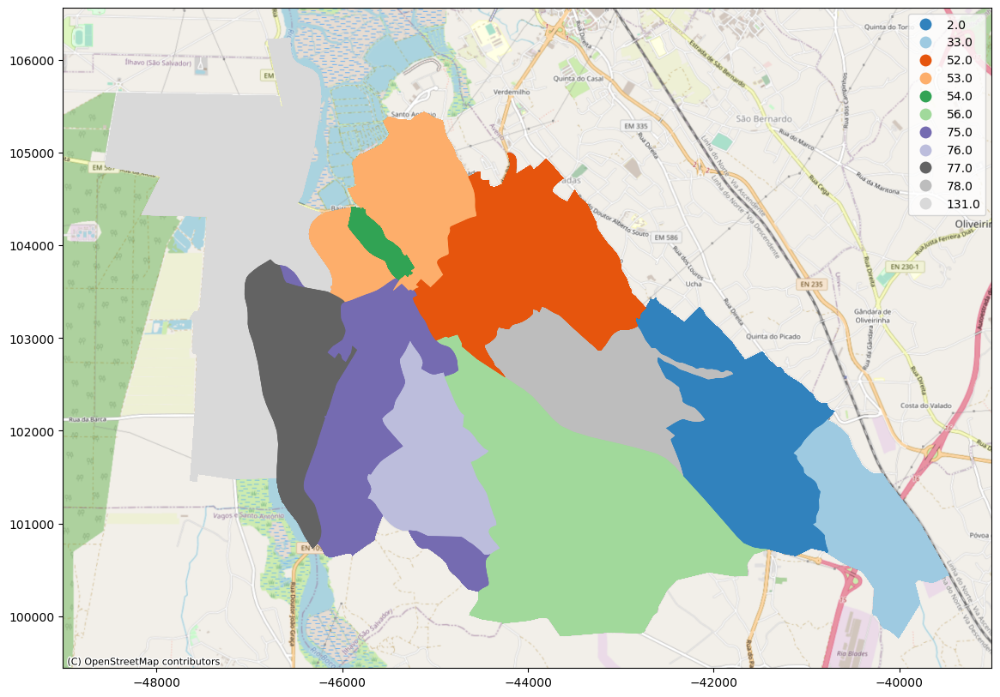

In [225]:
# check filtered clusters
ax=data_ilhavo.plot(column=data_ilhavo['Cluster_new'],categorical=True, legend=True, figsize=(20,10), cmap='tab20c')
cx.add_basemap(ax,crs=data_ilhavo.crs,source=cx.providers.OpenStreetMap.Mapnik)

In [226]:
data_ilhavo['D'].value_counts()

D
0    687
1     97
Name: count, dtype: int64

In [227]:
# get dummies
linreg_center_ilhavo = pd.get_dummies(data_ilhavo, columns=['Nature', 'Status', 'Year','Cluster_new'], drop_first=True)

In [228]:
linreg_center_ilhavo.reset_index(drop=True, inplace=True)

In [229]:
# calculate DT
linreg_center_ilhavo['DT']=linreg_center_ilhavo['D']*linreg_center_ilhavo['T']

In [230]:
# calculate log Typology
linreg_center_ilhavo['Log_Typ']=np.log(linreg_center_ilhavo['Typology'])

In [231]:
# number of dwellings per zone
pd.pivot_table(data_ilhavo, values='Log_P_A', index=['Cluster_new'], aggfunc=lambda x: len(x.unique()))

,Log_P_A
Cluster_new,
2.0,73
33.0,41
52.0,44
53.0,92
54.0,213
56.0,16
75.0,42
76.0,5
77.0,36


In [232]:
linreg_center_ilhavo.columns

Index(['ID', 'Typology', 'Price', 'Log_P_A', 'A', 'NrUtentes', 'AL_pc', 'T',
       'Log_AL', 'Log_Typ', 'geometry', 'area', 'Zona_Ward', 'Zona_Ward_Queen',
       'Zona_Maxp', 'Zona_SKATER', 'D', 'Nature_2.0', 'Status_2.0',
       'Status_3.0', 'Status_4.0', 'Status_5.0', 'Year_2006.0', 'Year_2007.0',
       'Year_2008.0', 'Year_2009.0', 'Year_2010.0', 'Year_2018.0',
       'Year_2019.0', 'Year_2020.0', 'Year_2021.0', 'Year_2022.0',
       'Year_2023.0', 'Cluster_new_33.0', 'Cluster_new_52.0',
       'Cluster_new_53.0', 'Cluster_new_54.0', 'Cluster_new_56.0',
       'Cluster_new_75.0', 'Cluster_new_76.0', 'Cluster_new_77.0',
       'Cluster_new_78.0', 'Cluster_new_131.0', 'DT'],
      dtype='object')

In [233]:
# define X and y
ilhavo_y_eur_area  = linreg_center_ilhavo['Log_P_A'].astype(float)

ilhavo_X_eur_area = linreg_center_ilhavo[['Log_Typ','DT','T','D','Log_AL',
       'Nature_2.0', 'Status_2.0', 'Status_3.0', 'Status_4.0', 'Status_5.0',
       'Year_2006.0', 'Year_2007.0', 'Year_2008.0', 'Year_2009.0',
       'Year_2010.0', 'Cluster_new_33.0',
       'Cluster_new_52.0', 'Cluster_new_53.0', 'Cluster_new_54.0',
       'Cluster_new_56.0', 'Cluster_new_76.0',
       'Cluster_new_78.0', 'Cluster_new_131.0']].astype(float)

# VIF inf removidos

In [234]:
# calculate VIF
vif_data = pd.DataFrame()
vif_data["feature"] = ilhavo_X_eur_area.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(ilhavo_X_eur_area.values, i)
                          for i in range(len(ilhavo_X_eur_area.columns))]

print(vif_data)

              feature        VIF
0             Log_Typ  47.435479
1                  DT   3.043264
2                   T  20.582665
3                   D   3.321251
4              Log_AL   4.103425
5          Nature_2.0   5.162610
6          Status_2.0   2.680263
7          Status_3.0   3.330923
8          Status_4.0   2.583959
9          Status_5.0   2.502417
10        Year_2006.0   1.849258
11        Year_2007.0   6.730954
12        Year_2008.0   7.982425
13        Year_2009.0   6.144379
14        Year_2010.0  11.729115
15   Cluster_new_33.0   1.581315
16   Cluster_new_52.0   1.794800
17   Cluster_new_53.0   2.757347
18   Cluster_new_54.0   4.283058
19   Cluster_new_56.0   1.199648
20   Cluster_new_76.0   1.087619
21   Cluster_new_78.0   1.092253
22  Cluster_new_131.0   1.591880


In [235]:
# run the model
ilhavo_X_eur_area = sm.add_constant(ilhavo_X_eur_area)
model_ilhavo_eur_area = sm.OLS(ilhavo_y_eur_area, ilhavo_X_eur_area.astype(float))
results_ilhavo_eur_area = model_ilhavo_eur_area.fit()
results_ilhavo_eur_area.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                 Results: Ordinary least squares
=================================================================
Model:              OLS              Adj. R-squared:     0.351   
Dependent Variable: Log_P_A          AIC:                391.0692
Date:               2023-06-05 15:44 BIC:                503.0150
No. Observations:   784              Log-Likelihood:     -171.53 
Df Model:           23               F-statistic:        19.44   
Df Residuals:       760              Prob (F-statistic): 1.60e-61
R-squared:          0.370            Scale:              0.093556
-----------------------------------------------------------------
                   Coef.  Std.Err.    t    P>|t|   [0.025  0.975]
-----------------------------------------------------------------
const              7.3428   0.1518 48.3652 0.0000  7.0448  7.6409
Log_Typ           -0.3987   0.0634 -6.2888 0.0000 -0.5231 -0.2742
DT                -0.0180   0.0779 -0.2304 0.8179 -0.1709  0.1350
T                  0.5094   0.1393  3.6576 0.0003  0.2360  0.7829
D                  0.0132   0.0571  0.2305 0.8177 -0.0989  0.1252
Log_AL            -1.4767   0.5332 -2.7696 0.0057 -2.5234 -0.4300
Nature_2.0         0.0434   0.0363  1.1969 0.2317 -0.0278  0.1146
Status_2.0        -0.0977   0.0389 -2.5151 0.0121 -0.1740 -0.0215
Status_3.0        -0.2446   0.0413 -5.9275 0.0000 -0.3256 -0.1636
Status_4.0        -0.3699   0.0499 -7.4088 0.0000 -0.4679 -0.2719
Status_5.0         0.1005   0.0359  2.7996 0.0052  0.0300  0.1709
Year_2006.0        0.1244   0.1496  0.8314 0.4060 -0.1693  0.4180
Year_2007.0        0.0765   0.1316  0.5812 0.5613 -0.1818  0.3348
Year_2008.0        0.0225   0.1295  0.1739 0.8620 -0.2317  0.2768
Year_2009.0        0.0359   0.1317  0.2722 0.7855 -0.2227  0.2945
Year_2010.0        0.0875   0.1298  0.6743 0.5003 -0.1673  0.3424
Cluster_new_33.0  -0.2184   0.0469 -4.6550 0.0000 -0.3105 -0.1263
Cluster_new_52.0   0.0508   0.0543  0.9358 0.3497 -0.0558  0.1574
Cluster_new_53.0   0.1339   0.0494  2.7096 0.0069  0.0369  0.2309
Cluster_new_54.0   0.0480   0.0394  1.2183 0.2235 -0.0294  0.1255
Cluster_new_56.0  -0.0041   0.0716 -0.0575 0.9542 -0.1447  0.1365
Cluster_new_76.0   0.1993   0.1427  1.3962 0.1631 -0.0809  0.4795
Cluster_new_78.0   0.1434   0.1847  0.7767 0.4376 -0.2191  0.5059
Cluster_new_131.0 -0.0910   0.0788 -1.1551 0.2484 -0.2456  0.0637
-----------------------------------------------------------------
Omnibus:             131.713      Durbin-Watson:         1.966   
Prob(Omnibus):       0.000        Jarque-Bera (JB):      2131.826
Skew:                0.071        Prob(JB):              0.000   
Kurtosis:            11.077       Condition No.:         96      
=================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the
errors is correctly specified.
"""

Temos muito poucos casos para D=1 (97 casos) e D=0 (687 casos). Tendo em conta a heterogenidade de casas (diferentes estados de preservação, tipologia, etc.), 97 casos não é suficiente para fazer uma análise estatística robusta.

## 5. Linear Regressions (Aveiro) - MaxP (Alternative to SKATER, section 3)

### 5.1 Data Preparation for DID Linear Regression

In [236]:
# copy data
spatial_data=all_data.copy()

In [237]:
plot_spatial_data=spatial_data.copy()

In [238]:
# transform data to geodataframe
plot_spatial_data=GeoDataFrame(plot_spatial_data, geometry='geometry')

In [239]:
plot_spatial_data.columns

Index(['ID', 'Nature', 'Typology', 'Status', 'Price', 'Log_P_A', 'A', 'Year',
       'Cluster_new', 'NrUtentes', 'AL_pc', 'T', 'Log_AL', 'Log_Typ',
       'geometry', 'area', 'Zona_Ward', 'Zona_Ward_Queen', 'Zona_Maxp',
       'Zona_SKATER'],
      dtype='object')

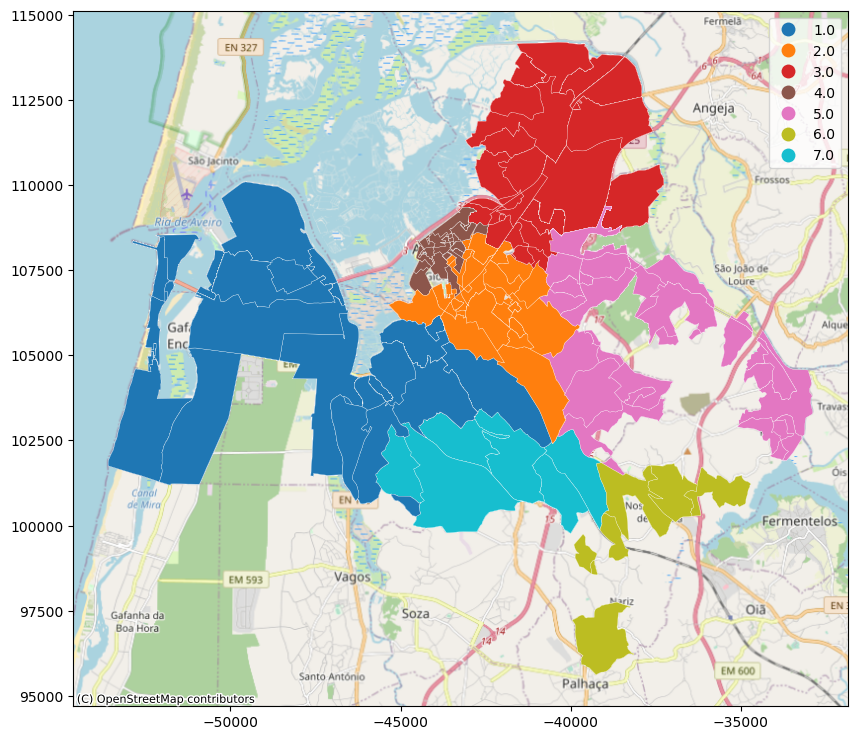

In [240]:
# view Zona_Maxp clusters
ax=plot_spatial_data.plot(figsize=(10, 10), column="Zona_Maxp", categorical=True, edgecolor="w", legend=True, linewidth=0.2,cmap='tab10')
cx.add_basemap(ax,crs=plot_spatial_data.crs,source=cx.providers.OpenStreetMap.Mapnik)


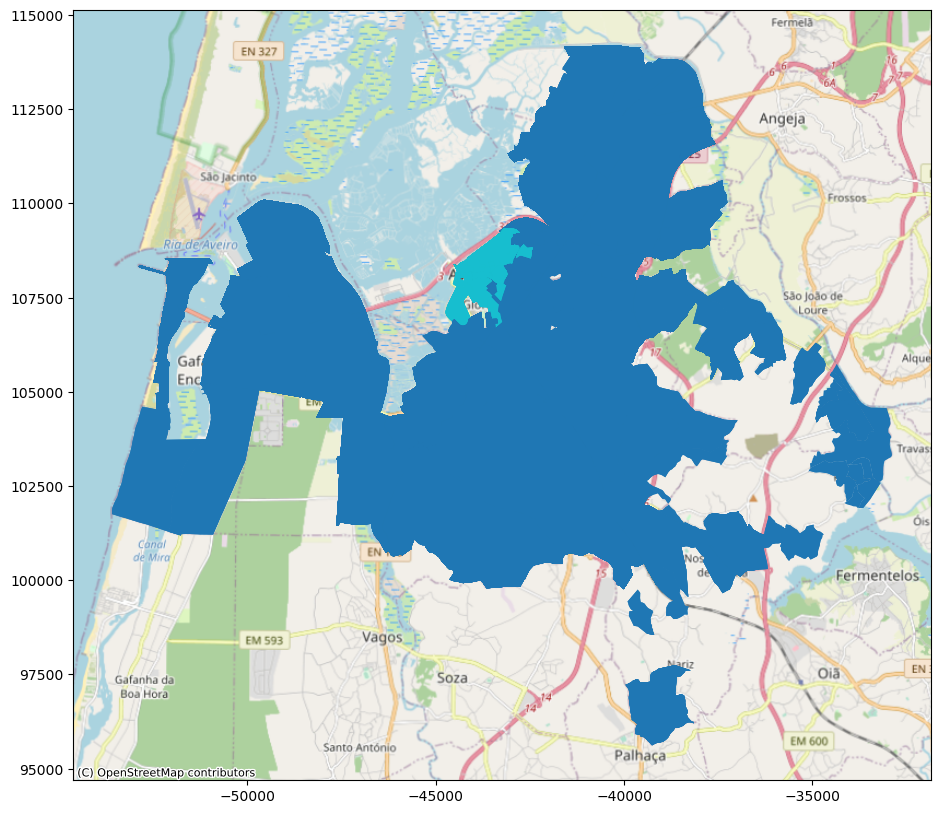

In [241]:
# view cluster of interest - Aveiro vity center
ax=plot_spatial_data.plot(plot_spatial_data['Zona_Maxp']==4.0,figsize=(20,10))
cx.add_basemap(ax,crs=plot_spatial_data.crs,source=cx.providers.OpenStreetMap.Mapnik)

In [242]:
plot_spatial_data.head()

,ID,Nature,Typology,Status,Price,Log_P_A,A,Year,Cluster_new,NrUtentes,AL_pc,T,Log_AL,Log_Typ,geometry,area,Zona_Ward,Zona_Ward_Queen,Zona_Maxp,Zona_SKATER
0,268352,2.0,5.0,1.0,224500.0,6.463698,350.0,2008.0,9.0,0.0,0.0,0.0,0.0,1.609438,"POLYGON ((-38979.844 107301.719, -39032.071 10...",0.127582,4.0,4.0,5.0,3.0
1,295929,1.0,4.0,3.0,137000.0,6.851002,145.0,2008.0,45.0,0.0,0.0,0.0,0.0,1.386294,"POLYGON ((-42807.987 107844.848, -42845.316 10...",0.048703,9.0,2.0,2.0,4.0
2,259211,1.0,3.0,1.0,193000.0,6.966439,182.0,2008.0,19.0,0.0,0.0,0.0,0.0,1.098612,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0
3,259235,2.0,5.0,4.0,374000.0,6.840547,400.0,2008.0,48.0,0.0,0.0,0.0,0.0,1.609438,"POLYGON ((-49390.576 107791.820, -49409.232 10...",2.742660,1.0,1.0,1.0,1.0
4,259228,1.0,2.0,1.0,91500.0,7.080289,77.0,2008.0,19.0,0.0,0.0,0.0,0.0,0.693147,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0


In [243]:
# filter data for Aveiro city center
data_aveiro=spatial_data[spatial_data['Zona_Maxp']==4.0]

In [244]:
# transform data to geodataframe
data_aveiro=GeoDataFrame(data_aveiro, geometry='geometry')

In [245]:
data_aveiro.reset_index(drop=True, inplace=True)

In [246]:
data_aveiro.head()

,ID,Nature,Typology,Status,Price,Log_P_A,A,Year,Cluster_new,NrUtentes,AL_pc,T,Log_AL,Log_Typ,geometry,area,Zona_Ward,Zona_Ward_Queen,Zona_Maxp,Zona_SKATER
0,259211,1.0,3.0,1.0,193000.0,6.966439,182.0,2008.0,19.0,0.0,0.0,0.0,0.0,1.098612,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0
1,259228,1.0,2.0,1.0,91500.0,7.080289,77.0,2008.0,19.0,0.0,0.0,0.0,0.0,0.693147,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0
2,259210,1.0,2.0,1.0,94000.0,7.020233,84.0,2008.0,19.0,0.0,0.0,0.0,0.0,0.693147,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0
3,295932,1.0,4.0,1.0,168100.0,6.957141,160.0,2008.0,19.0,0.0,0.0,0.0,0.0,1.386294,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0
4,259227,1.0,2.0,1.0,100000.0,6.969631,94.0,2008.0,19.0,0.0,0.0,0.0,0.0,0.693147,"POLYGON ((-43051.492 108661.656, -43052.174 10...",0.010973,8.0,3.0,4.0,5.0


In [247]:
# check no. of dwellings per cluster in Aveiro Center
pd.pivot_table(data_aveiro, values='Log_P_A', index=['Cluster_new'], aggfunc=lambda x: len(x.unique()))
# não incluir cluster 80, 102 e 106, por escassez de dados

,Log_P_A
Cluster_new,
19.0,414
22.0,5
24.0,93
28.0,4
31.0,207
40.0,63
41.0,95
42.0,44
57.0,27


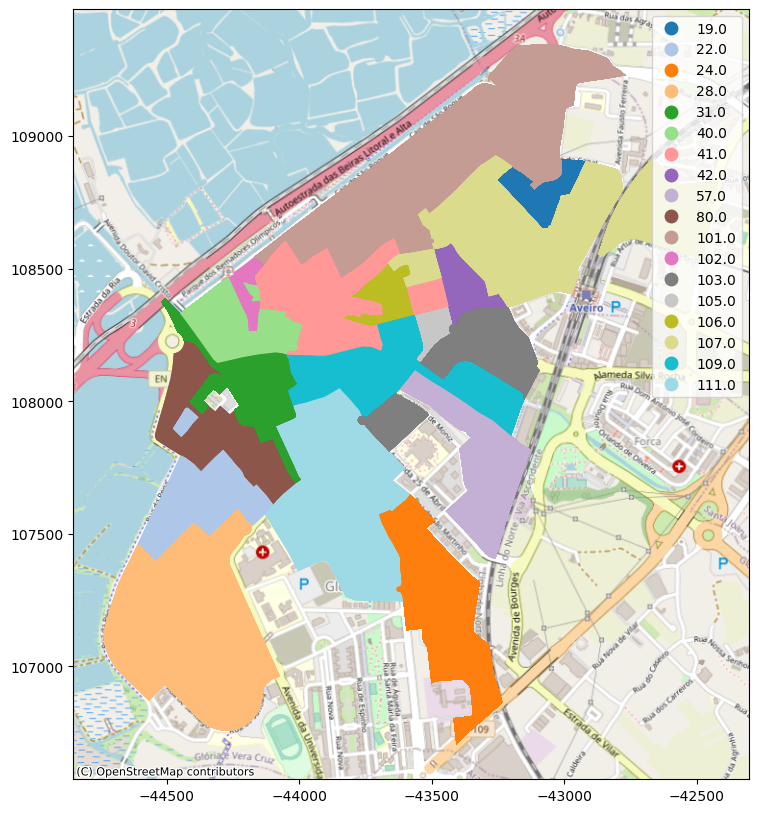

In [248]:
# view clusters in Aveiro city center
ax=data_aveiro.plot(column=data_aveiro['Cluster_new'],categorical=True, legend=True, figsize=(10,10), cmap='tab20')
cx.add_basemap(ax,crs=data_aveiro.crs,source=cx.providers.OpenStreetMap.Mapnik)

In [249]:
# Area de Intervenção, a ser considerada D = 1 (para MaxP)
lista_D1=[19,40,41,42,101,102,103,105,106,107,109]

In [250]:
# apply above list to data
data_aveiro['D']=np.where(data_aveiro['Cluster_new'].isin(lista_D1), 1, 0)

In [251]:
data_aveiro.to_pickle('../Data/data_aveiro_maxp.piclo')

In [252]:
data_aveiro['D'].value_counts()

D
1    1304
0     457
Name: count, dtype: int64

In [253]:
sum(data_aveiro['D'].value_counts())

1761

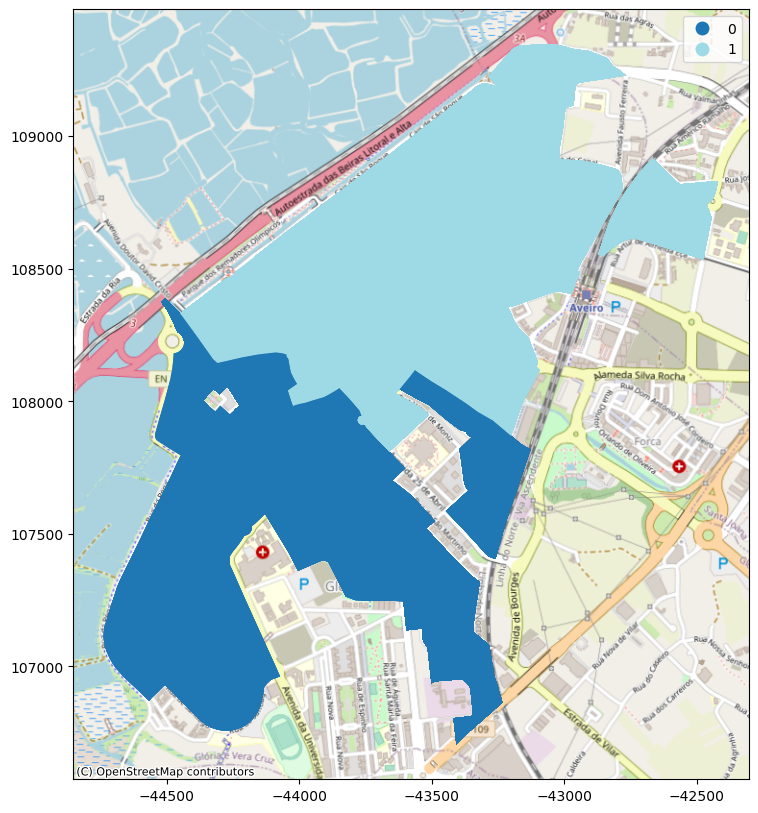

In [254]:
# check areas defined as control and intervention areas (D=0 and D=1)
ax=data_aveiro.plot(column=data_aveiro['D'],categorical=True, legend=True, figsize=(10,10), cmap='tab20')
cx.add_basemap(ax,crs=data_aveiro.crs,source=cx.providers.OpenStreetMap.Mapnik)

In [255]:
# calculate DT (true when both D and T are equal to 1)
data_aveiro['DT']=data_aveiro['D']*data_aveiro['T']

In [256]:
# valores do Indice de Preços da Habitação para Aveiro (valores para 21, 22 e 23 são previsões, com base na tendência dos últimos anos)
IPI2005=116.5
IPI2006=110.9
IPI2007=114.3
IPI2008=109.4
IPI2009=103.1
IPI2010=104.4
IPI2018=100.8
IPI2019=114.2
IPI2020=126.2
IPI2021=131.9
IPI2022=133.3
IPI2023=134.6

In [257]:
# write IPI values to new column
def new_column_value(Year):
    if Year == 2005.0:
        return IPI2005
    elif Year == 2006.0:
        return IPI2006
    elif Year == 2007.0:
        return IPI2007
    elif Year == 2008.0:
        return IPI2008
    elif Year == 2009.0:
        return IPI2009
    elif Year == 2010.0:
        return IPI2010
    elif Year == 2018.0:
        return IPI2018
    elif Year == 2019.0:
        return IPI2019
    elif Year == 2020.0:
        return IPI2020
    elif Year == 2021.0:
        return IPI2021
    elif Year == 2022.0:
        return IPI2022
    elif Year == 2023.0:
        return IPI2023


data_aveiro["IPI"] = data_aveiro["Year"].apply(new_column_value)

In [258]:
# calculate log of IPI
data_aveiro["Log_IPI"]=np.log(data_aveiro['IPI'])

In [259]:
# calculate log of Typology
data_aveiro['Log_Typ']=np.log(data_aveiro['Typology'])

In [260]:
# get dummies
linreg_center = pd.get_dummies(data_aveiro, columns=['Nature','Status','Year','Cluster_new'], drop_first=True, dtype=float)

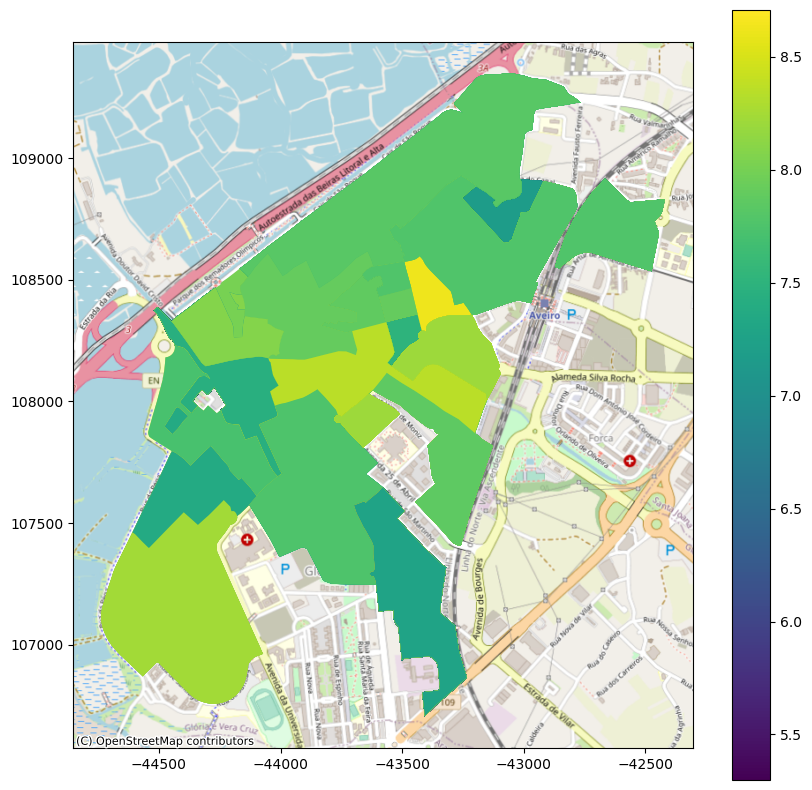

In [261]:
# check log_P_A distribution in the territory
ax=data_aveiro.plot(column=data_aveiro['Log_P_A'], legend=True, figsize=(10,10), cmap='viridis')
cx.add_basemap(ax,crs=data_aveiro.crs,source=cx.providers.OpenStreetMap.Mapnik)

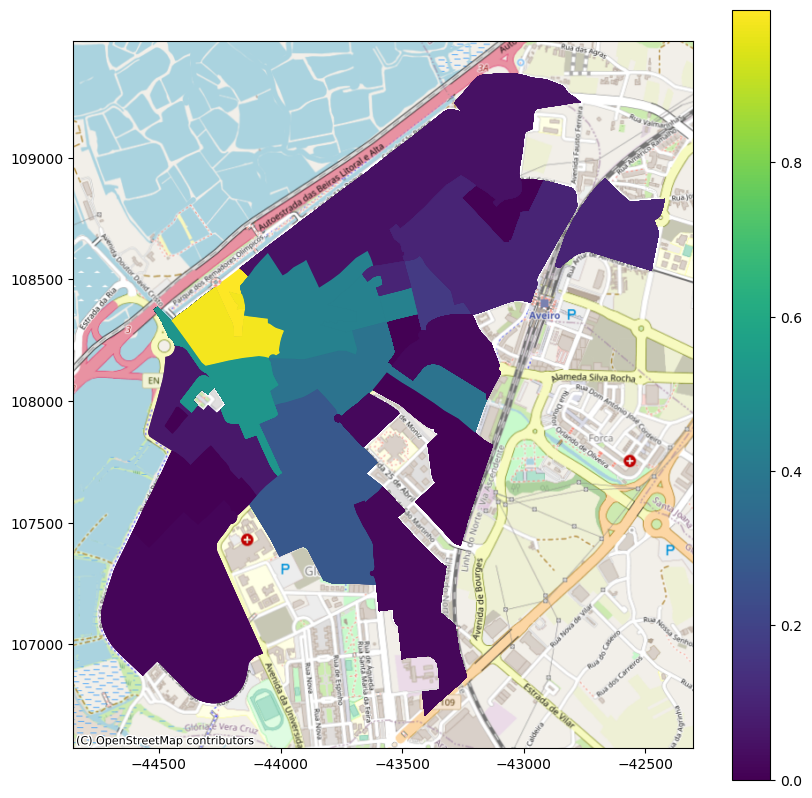

In [262]:
# check log_AL distribution in the territory
ax=data_aveiro.plot(column=data_aveiro['Log_AL'], legend=True, figsize=(10,10), cmap='viridis')
cx.add_basemap(ax,crs=data_aveiro.crs,source=cx.providers.OpenStreetMap.Mapnik)

### 5.2 Linear Regression (focused in Aveiro Center - MaxP Cluster)

In [263]:
linreg_center.columns

Index(['ID', 'Typology', 'Price', 'Log_P_A', 'A', 'NrUtentes', 'AL_pc', 'T',
       'Log_AL', 'Log_Typ', 'geometry', 'area', 'Zona_Ward', 'Zona_Ward_Queen',
       'Zona_Maxp', 'Zona_SKATER', 'D', 'DT', 'IPI', 'Log_IPI', 'Nature_2.0',
       'Status_2.0', 'Status_3.0', 'Status_4.0', 'Status_5.0', 'Year_2006.0',
       'Year_2007.0', 'Year_2008.0', 'Year_2009.0', 'Year_2010.0',
       'Year_2018.0', 'Year_2019.0', 'Year_2020.0', 'Year_2021.0',
       'Year_2022.0', 'Year_2023.0', 'Cluster_new_22.0', 'Cluster_new_24.0',
       'Cluster_new_28.0', 'Cluster_new_31.0', 'Cluster_new_40.0',
       'Cluster_new_41.0', 'Cluster_new_42.0', 'Cluster_new_57.0',
       'Cluster_new_80.0', 'Cluster_new_101.0', 'Cluster_new_102.0',
       'Cluster_new_103.0', 'Cluster_new_105.0', 'Cluster_new_106.0',
       'Cluster_new_107.0', 'Cluster_new_109.0', 'Cluster_new_111.0'],
      dtype='object')

In [264]:
# check number of dwellings per cluster
pd.pivot_table(data_aveiro, values='Log_P_A', index=['Cluster_new'], aggfunc=lambda x: len(x.unique()))

,Log_P_A
Cluster_new,
19.0,414
22.0,5
24.0,93
28.0,4
31.0,207
40.0,63
41.0,95
42.0,44
57.0,27


In [265]:
# define X and y
c_y_eur_area  = linreg_center['Log_P_A'].astype(float)

c_X_eur_area = linreg_center[['DT','D','T',
       'Nature_2.0','Log_AL', 'Log_Typ',
       'Status_2.0', 'Status_3.0', 'Status_4.0', 'Status_5.0',
       'Year_2006.0', 'Year_2007.0', 'Year_2008.0', 'Year_2009.0',
       'Year_2010.0','Year_2019.0', 'Year_2020.0',
       'Year_2021.0', 'Year_2022.0', 'Year_2023.0',
       'Cluster_new_24.0','Cluster_new_31.0', 'Cluster_new_40.0',
       'Cluster_new_41.0', 'Cluster_new_42.0', 'Cluster_new_57.0',
       'Cluster_new_101.0','Cluster_new_103.0', 'Cluster_new_105.0',
       'Cluster_new_107.0', 'Cluster_new_109.0']].astype(float)


# menos de 10 casos - Clusters: 106.0, 102.0, 80.0, 28.0 e 22.0, 110.0
# removido Log_IPI, Year_2023, Year_2018 VIF muito alto

In [266]:
# check VIF
vif_data = pd.DataFrame()
vif_data["feature"] = c_X_eur_area.columns
  
# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(c_X_eur_area.values, i)
                          for i in range(len(c_X_eur_area.columns))]

print(vif_data)

              feature        VIF
0                  DT   7.761442
1                   D  70.320915
2                   T  30.644668
3          Nature_2.0   1.863002
4              Log_AL  14.261764
5             Log_Typ  12.593248
6          Status_2.0   2.087538
7          Status_3.0   2.500212
8          Status_4.0   1.722404
9          Status_5.0   2.800572
10        Year_2006.0   4.030497
11        Year_2007.0  17.972914
12        Year_2008.0  25.010808
13        Year_2009.0  15.499301
14        Year_2010.0  20.207210
15        Year_2019.0   2.027801
16        Year_2020.0   1.438680
17        Year_2021.0   1.391755
18        Year_2022.0   1.699672
19        Year_2023.0   1.432376
20   Cluster_new_24.0   7.463169
21   Cluster_new_31.0  15.682545
22   Cluster_new_40.0   3.044613
23   Cluster_new_41.0   1.607348
24   Cluster_new_42.0   1.321078
25   Cluster_new_57.0   2.595753
26  Cluster_new_101.0   2.659177
27  Cluster_new_103.0   3.051075
28  Cluster_new_105.0   1.748310
29  Cluste

In [267]:
# linear model for casasapo with log of price per square meter as dependent variable
c_X_eur_area = sm.add_constant(c_X_eur_area)
model_c_eur_area = sm.OLS(c_y_eur_area, c_X_eur_area)
results_c_eur_area = model_c_eur_area.fit()
results_c_eur_area.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                 Results: Ordinary least squares
==================================================================
Model:              OLS              Adj. R-squared:     0.586    
Dependent Variable: Log_P_A          AIC:                -16.8557 
Date:               2023-06-05 15:44 BIC:                158.3007 
No. Observations:   1761             Log-Likelihood:     40.428   
Df Model:           31               F-statistic:        81.44    
Df Residuals:       1729             Prob (F-statistic): 7.11e-311
R-squared:          0.594            Scale:              0.056957 
------------------------------------------------------------------
                    Coef.  Std.Err.    t    P>|t|   [0.025  0.975]
------------------------------------------------------------------
const               7.1667   0.1799 39.8435 0.0000  6.8139  7.5195
DT                  0.3843   0.0452  8.4933 0.0000  0.2955  0.4730
D                  -0.0717   0.0585 -1.2268 0.2201 -0.1864  0.0429
T                   0.6731   0.1753  3.8389 0.0001  0.3292  1.0169
Nature_2.0         -0.1974   0.0270 -7.3177 0.0000 -0.2503 -0.1445
Log_AL             -1.0379   0.1040 -9.9825 0.0000 -1.2418 -0.8340
Log_Typ            -0.1020   0.0172 -5.9440 0.0000 -0.1356 -0.0683
Status_2.0         -0.0329   0.0197 -1.6724 0.0946 -0.0715  0.0057
Status_3.0         -0.1568   0.0173 -9.0584 0.0000 -0.1907 -0.1228
Status_4.0         -0.2567   0.0275 -9.3278 0.0000 -0.3107 -0.2028
Status_5.0          0.0356   0.0206  1.7320 0.0835 -0.0047  0.0760
Year_2006.0         0.2969   0.1724  1.7224 0.0852 -0.0412  0.6350
Year_2007.0         0.2335   0.1702  1.3717 0.1703 -0.1004  0.5674
Year_2008.0         0.2406   0.1696  1.4185 0.1562 -0.0921  0.5734
Year_2009.0         0.2241   0.1699  1.3190 0.1874 -0.1091  0.5574
Year_2010.0         0.2057   0.1697  1.2121 0.2256 -0.1271  0.5385
Year_2019.0         0.3291   0.0631  5.2142 0.0000  0.2053  0.4529
Year_2020.0         0.3038   0.0401  7.5778 0.0000  0.2252  0.3824
Year_2021.0         0.4111   0.0430  9.5707 0.0000  0.3268  0.4953
Year_2022.0         0.5857   0.0465 12.6025 0.0000  0.4945  0.6768
Year_2023.0         0.7710   0.1010  7.6329 0.0000  0.5729  0.9691
Cluster_new_24.0   -0.0995   0.0596 -1.6699 0.0951 -0.2163  0.0174
Cluster_new_31.0    0.0121   0.0604  0.2002 0.8413 -0.1063  0.1305
Cluster_new_40.0    0.5060   0.0417 12.1259 0.0000  0.4241  0.5878
Cluster_new_41.0    0.1823   0.0282  6.4580 0.0000  0.1270  0.2377
Cluster_new_42.0   -0.0296   0.0392 -0.7565 0.4494 -0.1065  0.0472
Cluster_new_57.0   -0.0480   0.0686 -0.6987 0.4848 -0.1826  0.0867
Cluster_new_101.0  -0.4321   0.0616 -7.0134 0.0000 -0.5530 -0.3113
Cluster_new_103.0  -0.4262   0.0677 -6.2946 0.0000 -0.5590 -0.2934
Cluster_new_105.0   0.1496   0.0312  4.7878 0.0000  0.0883  0.2109
Cluster_new_107.0  -0.4655   0.0535 -8.6943 0.0000 -0.5705 -0.3605
Cluster_new_109.0  -0.0114   0.0656 -0.1744 0.8616 -0.1402  0.1173
------------------------------------------------------------------
Omnibus:              196.567      Durbin-Watson:         1.714   
Prob(Omnibus):        0.000        Jarque-Bera (JB):      1595.574
Skew:                 -0.153       Prob(JB):              0.000   
Kurtosis:             7.653        Condition No.:         144     
==================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the
errors is correctly specified.
"""

#### 5.1.a - Diagnostic plots
https://www.statsmodels.org/dev/examples/notebooks/generated/linear_regression_diagnostics_plots.html

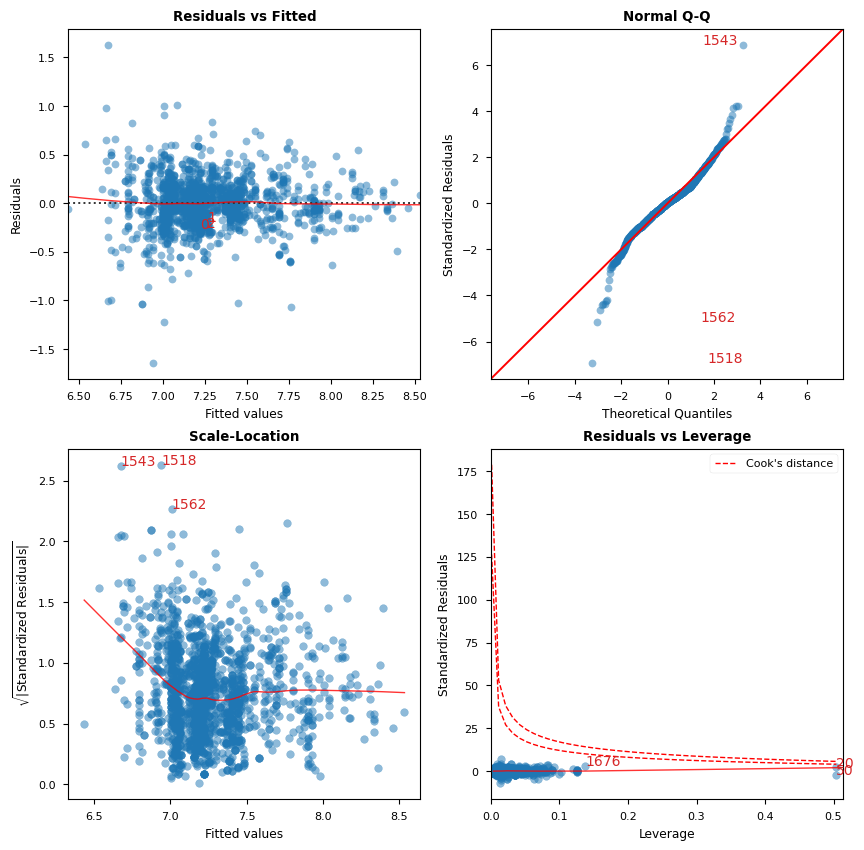

             Features  VIF Factor
25   Cluster_new_42.0        1.28
18        Year_2021.0        1.36
17        Year_2020.0        1.40
6             Log_Typ        1.43
20        Year_2023.0        1.43
24   Cluster_new_41.0        1.50
9          Status_4.0        1.60
29  Cluster_new_105.0        1.65
19        Year_2022.0        1.66
4          Nature_2.0        1.71
7          Status_2.0        1.74
8          Status_3.0        1.83
16        Year_2019.0        1.99
10         Status_5.0        2.21
31  Cluster_new_109.0        2.45
27  Cluster_new_101.0        2.61
26   Cluster_new_57.0        2.68
30  Cluster_new_107.0        2.68
23   Cluster_new_40.0        2.88
28  Cluster_new_103.0        2.99
1                  DT        6.84
21   Cluster_new_24.0        7.66
5              Log_AL       11.08
22   Cluster_new_31.0       14.58
2                   D       20.31
11        Year_2006.0       25.84
14        Year_2009.0      108.01
12        Year_2007.0      116.29
15        Year

In [268]:
# plot diagnostics for the model
cls = Linear_Reg_Diagnostic(results_c_eur_area)
fig, ax = cls()